# Stress-Test Fire Environments
Synthetic scenarios for stress-testing heuristics. Each cell below instantiates a distinct `FireEnv` that isolates a single factor (fuel jumps, downwind corridors, asset clusters ...) plus a realistic configuration that is based on Victoria/Aus. 

In [1]:
"""
# ==========================================================
# FIX: objective must aggregate correctly over sims and apply decision-time drop
# Put this cell RIGHT AFTER importing RetardantDropBayesOpt (before running baselines/BO).
# ==========================================================
import numpy as np
from fire_model.bo import RetardantDropBayesOpt

def expected_value_burned_area_FIXED(self, theta: np.ndarray) -> float:
    # Retardant is applied at decision time; first advance to drop_time_s with no retardant.
    drone_params = self.decode_theta(theta)

    init_state = self._get_drop_firestate()

    evolved_firestate = self.fire_model.simulate_from_firestate(
        init_state,
        T=self.evolution_time_s,
        n_sims=self.n_sims,
        drone_params=drone_params,
        ros_mps=self.fire_model.env.ros_mps,
        wind_coeff=self.fire_model.env.wind_coeff,
        diag=self.fire_model.env.diag,
        seed=None,
        avoid_burning_drop=self.fire_model.env.avoid_burning_drop,
        burning_prob_threshold=self.fire_model.env.avoid_drop_p_threshold,
    )

    # burning/burned can be either:
    #   (n_sims, nx, ny) -> we want expectation over sims
    #   (nx, ny)        -> already an aggregated/probability map
    p_burning = np.asarray(evolved_firestate.burning, dtype=float)
    p_burned  = np.asarray(evolved_firestate.burned, dtype=float)

    if p_burning.ndim == 3:
        p_burning = p_burning.mean(axis=0)
    if p_burned.ndim == 3:
        p_burned = p_burned.mean(axis=0)

    p_affected = np.clip(p_burning + p_burned, 0.0, 1.0)

    nx, _ = self.fire_model.env.grid_size
    dx = self.fire_model.env.domain_km / nx  # km per cell (matches your existing scaling)
    expected_value_burned = float(np.sum(p_affected * self.fire_model.env.value) * (dx ** 2))
    return expected_value_burned

# Monkey-patch into the class for this notebook session
RetardantDropBayesOpt.expected_value_burned_area = expected_value_burned_area_FIXED
"""


'\n# ==========================================================\n# FIX: objective must aggregate correctly over sims and apply decision-time drop\n# Put this cell RIGHT AFTER importing RetardantDropBayesOpt (before running baselines/BO).\n# ==========================================================\nimport numpy as np\nfrom fire_model.bo import RetardantDropBayesOpt\n\ndef expected_value_burned_area_FIXED(self, theta: np.ndarray) -> float:\n    # Retardant is applied at decision time; first advance to drop_time_s with no retardant.\n    drone_params = self.decode_theta(theta)\n\n    init_state = self._get_drop_firestate()\n\n    evolved_firestate = self.fire_model.simulate_from_firestate(\n        init_state,\n        T=self.evolution_time_s,\n        n_sims=self.n_sims,\n        drone_params=drone_params,\n        ros_mps=self.fire_model.env.ros_mps,\n        wind_coeff=self.fire_model.env.wind_coeff,\n        diag=self.fire_model.env.diag,\n        seed=None,\n        avoid_burning_d

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from fire_model.ca import FireEnv

# =========================
# Evidence links (used below)
# =========================
# Vic slope rule-of-thumb (CFA Victoria): fire doubles speed for every 10° upslope (and halves downhill).
# https://www.cfa.vic.gov.au/plan-prepare/bushfire-basics/how-fire-behaves
#
# Extreme-day spread rates used as calibration targets (Tolhurst 2009, PHOENIX RapidFire modelling):
# “as fast as 60 km/h in grassland and 40 km/h in forest” (short pulses).
# https://exposed.net.au/tolhurst_2009.pdf
#
# Wind change (“cool change”) context (Australia):
# https://www.sbs.com.au/news/article/whats-the-weather-after-the-heatwave/rhbhojy2l
#
# Barriers like roads/lines can partially stop spread (NWCG S-290 workbook mentions “barriers”).
# https://training.nwcg.gov/dl/s290/s-290-student-workbook-all.pdf
#
# Retardant persistence (manufacturer): effective until a significant rain event.
# https://www.perimeter-solutions.com/en/phos-chek-wildfire-home-defense-faqs/
#
# Drop footprint example (USAF MAFFS): ~1/4 mile long, ~60 ft wide.
# https://www.af.mil/About-Us/Fact-Sheets/Display/Article/104558/modular-airborne-fire-fighting-system/

# ==========================================================
# IMPORTANT: "use slope correctly" requires a tiny model patch
# ==========================================================
# Patch your FireModel step_batch (in fire_model/ca.py) to multiply bias by a slope factor:
#
#   if env.slope is not None:
#       sxg = env.slope[..., 0]   # dz/dx (dimensionless grade)
#       syg = env.slope[..., 1]   # dz/dy
#       grade_along = sxg * ux + syg * uy
#       theta = np.arctan(grade_along) * 180.0 / np.pi
#       theta = np.clip(theta, -30.0, 30.0)
#       slope_factor = np.power(2.0, theta / 10.0)  # CFA: *2 per +10°, /2 per -10°
#       bias *= slope_factor

# =========================
# Scenario: Victoria-style
# =========================
nx = ny = 240
domain_km = 12.0
dx_m = (domain_km / nx) * 1000.0

xs = np.linspace(-3.2, 3.2, nx)[:, None]
ys = np.linspace(-3.2, 3.2, ny)[None, :]
X = xs.repeat(ny, axis=1)
Y = ys.repeat(nx, axis=0)

rng = np.random.default_rng(11)

# -----------------------------------
# Helper: distance-to-polyline (sampled)
# -----------------------------------
def distance_to_curve(xgrid, ygrid, pts):
    dmin = np.full(xgrid.shape, np.inf, dtype=float)
    for px, py in pts:
        d = np.sqrt((xgrid - px) ** 2 + (ygrid - py) ** 2)
        dmin = np.minimum(dmin, d)
    return dmin

# ==========================================================
# 1) Terrain: valley + gentle hills + stochastic relief
# ==========================================================
raw = rng.normal(size=(nx, ny))
smooth = raw.copy()
for _ in range(6):
    smooth = (
        0.40 * smooth
        + 0.10 * np.roll(smooth, 1, 0) + 0.10 * np.roll(smooth, -1, 0)
        + 0.10 * np.roll(smooth, 1, 1) + 0.10 * np.roll(smooth, -1, 1)
        + 0.05 * np.roll(np.roll(smooth, 1, 0), 1, 1)
        + 0.05 * np.roll(np.roll(smooth, -1, 0), -1, 1)
        + 0.05 * np.roll(np.roll(smooth, 1, 0), -1, 1)
        + 0.05 * np.roll(np.roll(smooth, -1, 0), 1, 1)
    )
smooth = (smooth - smooth.mean()) / (smooth.std() + 1e-9)

valley = -95.0 * np.exp(-((Y + 0.05) ** 2) / 0.35)
upland = 65.0 * (1.0 - np.exp(-((Y + 0.05) ** 2) / 1.10))
west_rise = 40.0 * (1.0 / (1.0 + np.exp((X - 0.3) / 0.55)))  # higher to the west

elev_m = 190.0 + valley + upland + west_rise + 18.0 * smooth
elev_m = np.clip(elev_m, 80.0, 360.0)

# ==========================================================
# 2) River (vertical squiggly)
# ==========================================================
rt = np.linspace(-3.2, 3.2, 260)
river_x0 = -0.45
river_x = river_x0 + 0.22 * np.sin(0.75 * rt) + 0.08 * np.sin(2.3 * rt)
river_y = rt
river_pts = np.stack([river_x, river_y], axis=1)
d_river = distance_to_curve(X, Y, river_pts)

river_mask = d_river < 0.035
riparian_mask = d_river < 0.095

elev_m = elev_m - 14.0 * np.exp(-(d_river**2) / (2 * 0.030**2))
elev_m = np.clip(elev_m, 70.0, 360.0)

# Slope
dzdx = np.gradient(elev_m, dx_m, axis=0)
dzdy = np.gradient(elev_m, dx_m, axis=1)
slope = np.stack([dzdx, dzdy], axis=-1)
slope_deg = np.degrees(np.arctan(np.sqrt(dzdx**2 + dzdy**2)))

# ==========================================================
# 3) Two main towns (as before)
# ==========================================================
flat = slope_deg < 6.0
not_water = ~river_mask

cand0 = flat & not_water & (np.abs(Y) < 0.85) & (d_river > 0.07) & (d_river < 0.20) & (X < 0.5)
cand1 = flat & not_water & (np.abs(Y) < 0.90) & (d_river > 0.35) & (X > 0.6)

def pick_town(mask, prefer_x, prefer_y=0.0):
    score = mask.astype(float)
    score *= np.exp(-(slope_deg**2) / (2 * 4.0**2))
    score *= np.exp(-((Y - prefer_y)**2) / (2 * 0.60**2))
    score *= np.exp(-((X - prefer_x)**2) / (2 * 0.80**2))
    i, j = np.unravel_index(np.argmax(score), score.shape)
    return (i, j)

town0 = pick_town(cand0, prefer_x=-0.2, prefer_y=0.1)   # near river
town1 = pick_town(cand1, prefer_x=+1.6, prefer_y=-0.1)  # east valley terrace

# ==========================================================
# 4) Roads
ROAD_FUEL_FACTOR = 0.10  # roads are burnable but much less likely to carry fire
#    - Main highway E-W
#    - NW feeder now EXTENDS to the map edge (your request)
#    - Two short town connectors
# ==========================================================
t = np.linspace(-3.2, 3.2, 260)
hw_pts = np.stack([t, -0.10 + 0.22 * np.sin(0.55 * t)], axis=1)
d_hw = distance_to_curve(X, Y, hw_pts)

# Junction on highway west of river
junction_x = river_x0 - 0.55
k_j = int(np.argmin(np.abs(hw_pts[:, 0] - junction_x)))
junction = hw_pts[k_j]

# NW feeder: explicitly runs from TOP-LEFT edge down to the junction (full extent)
# Start at (x=-3.2, y=+3.2) which is the top-left boundary in our coord system.
s = np.linspace(0.0, 1.0, 340)
nw_start = np.array([-3.2, 3.2])
feeder = (1 - s)[:, None] * nw_start + s[:, None] * junction
feeder[:, 1] += 0.24 * np.sin(np.pi * s)  # gentle curve
d_feeder = distance_to_curve(X, Y, feeder)

def nearest_point(poly_pts, p):
    d = np.sqrt((poly_pts[:, 0] - p[0]) ** 2 + (poly_pts[:, 1] - p[1]) ** 2)
    return poly_pts[int(np.argmin(d))]

def connector(town_xy, hw_pts, bend_sign, n=160):
    hx, hy = nearest_point(hw_pts, town_xy)
    s = np.linspace(0.0, 1.0, n)
    x = (1 - s) * town_xy[0] + s * hx
    y = (1 - s) * town_xy[1] + s * hy + 0.10 * np.sin(np.pi * s) * bend_sign
    return np.stack([x, y], axis=1)

town0_xy = (xs[town0[0], 0], ys[0, town0[1]])
town1_xy = (xs[town1[0], 0], ys[0, town1[1]])

conn0 = connector(town0_xy, hw_pts, bend_sign=+1.0)
conn1 = connector(town1_xy, hw_pts, bend_sign=-1.0)
d_conn0 = distance_to_curve(X, Y, conn0)
d_conn1 = distance_to_curve(X, Y, conn1)

road_mask = (d_hw < 0.045) | (d_feeder < 0.040) | (d_conn0 < 0.030) | (d_conn1 < 0.030)

# ==========================================================
# 5) Add a small town near the LEFT road (NW feeder)
#    - Small settlement along the feeder, flat-ish, not on river.
# ==========================================================
# Pick candidate pixels near feeder, away from junction, away from river, and relatively flat.
near_feeder = (d_feeder > 0.02) & (d_feeder < 0.10)
away_from_junction = np.sqrt((X - junction[0])**2 + (Y - junction[1])**2) > 0.9
cand_small = flat & not_water & near_feeder & away_from_junction & (X < -1.4) & (Y > 0.6)

small_town = pick_town(cand_small, prefer_x=-2.2, prefer_y=1.6)

# Flatten pads for all towns (built environments)
for (ti, tj) in [town0, town1, small_town]:
    cx = xs[ti, 0]
    cy = ys[0, tj]
    r2 = (X - cx) ** 2 + (Y - cy) ** 2
    pad = np.exp(-r2 / (2 * 0.18**2))
    elev_m = (1.0 - 0.60 * pad) * elev_m + (0.60 * pad) * elev_m[ti, tj]

# Recompute slope after flattening
dzdx = np.gradient(elev_m, dx_m, axis=0)
dzdy = np.gradient(elev_m, dx_m, axis=1)
slope = np.stack([dzdx, dzdy], axis=-1)
slope_deg = np.degrees(np.arctan(np.sqrt(dzdx**2 + dzdy**2)))

town_centers = [town0, town1, small_town]

# ==========================================================
# 6) Fuels
# ==========================================================
fuel = 0.85 * np.ones((nx, ny), dtype=float)
upland_fuel = 1.05 * (1.0 - np.exp(-((Y + 0.05) ** 2) / 1.10))
fuel += upland_fuel

patch = rng.normal(size=(nx, ny))
for _ in range(4):
    patch = 0.60 * patch + 0.10 * np.roll(patch, 1, 0) + 0.10 * np.roll(patch, -1, 0) + 0.10 * np.roll(patch, 1, 1) + 0.10 * np.roll(patch, -1, 1)
patch = (patch - patch.mean()) / (patch.std() + 1e-9)
fuel *= (1.0 + 0.08 * patch)

# Roads reduce fuel (barrier effect).
# Evidence: barriers can partially stop spread (NWCG S-290).
# https://training.nwcg.gov/dl/s290/s-290-student-workbook-all.pdf
fuel *= np.where(road_mask, ROAD_FUEL_FACTOR, 1.0)
fuel *= np.where(river_mask, 0.05, 1.0)
fuel *= np.where(riparian_mask & (~river_mask), 0.75, 1.0)
fuel = np.clip(fuel, 0.05, 3.10)
# Make hard barriers truly non-burnable
nonburnable = river_mask  # add riparian_mask too if you want it non-burnable
fuel[nonburnable] = 0.0

# ==========================================================
# 7) Values-at-risk (town0 slightly bigger; small town modest)
# ==========================================================
value = np.ones((nx, ny), dtype=float)

def add_town_value(center, core_amp, core_sigma, wui_amp, wui_sigma):
    ti, tj = center
    cx = xs[ti, 0]
    cy = ys[0, tj]
    r2 = (X - cx) ** 2 + (Y - cy) ** 2
    return core_amp * np.exp(-r2 / core_sigma) + wui_amp * np.exp(-r2 / wui_sigma)

# Town 0 (near river): slightly bigger / higher value
value += add_town_value(town0, core_amp=11.0, core_sigma=0.085, wui_amp=3.2, wui_sigma=0.26)
# Town 1
value += add_town_value(town1, core_amp=8.0, core_sigma=0.08, wui_amp=3.0, wui_sigma=0.25)
# Small town near feeder: modest
value += add_town_value(small_town, core_amp=5.5, core_sigma=0.07, wui_amp=2.0, wui_sigma=0.20)

value += 0.8 * road_mask.astype(float)
value += 1.2 * (riparian_mask & (~river_mask)).astype(float)

# ==========================================================
# 8) Wind: NW prefrontal + SW cool change
# ==========================================================
# Wind change evidence context:
# https://www.sbs.com.au/news/article/whats-the-weather-after-the-heatwave/rhbhojy2l
#
# NOTE: wind_coeff has units 1/(m/s) in your model form: bias = 1 + wind_coeff * max(0, align)
dt_s = 10.0
T_hours = 6.0
num_steps = int(T_hours * 3600 / dt_s)

wind = np.zeros((num_steps, nx, ny, 2), dtype=float)

phase1_steps = int(4.0 * 3600 / dt_s)
w1 = 15.0
wind[:phase1_steps, ..., 0] = +w1 / np.sqrt(2)
wind[:phase1_steps, ..., 1] = -w1 / np.sqrt(2)

w2 = 12.0
wind[phase1_steps:, ..., 0] = +w2 / np.sqrt(2)
wind[phase1_steps:, ..., 1] = +w2 / np.sqrt(2)

gust = rng.normal(0.0, 1.0, size=(num_steps, 1, 1, 2))
wind *= (1.0 + 0.10 * gust)
wind = np.clip(wind, -25.0, 25.0)

# ==========================================================
# 9) Retardant + ROS
# ==========================================================
# Retardant persistence evidence: effective until significant rain event.
# https://www.perimeter-solutions.com/en/phos-chek-wildfire-home-defense-faqs/
#
# MAFFS footprint example: ~1/4 mile long (~0.4 km), ~60 ft wide (~18 m)
# https://www.af.mil/About-Us/Fact-Sheets/Display/Article/104558/modular-airborne-fire-fighting-system/
drop_w_km = 0.5#0.05

drop_h_km = 0.60

# Tolhurst calibration targets:
# https://exposed.net.au/tolhurst_2009.pdf
realistic_env = FireEnv(
    grid_size=(nx, ny),
    domain_km=domain_km,
    fuel=fuel,
    value=value,
    wind=wind,
    slope=slope,  # <-- only affects spread if you applied the slope patchs
    dt_s=dt_s,

    burn_time_s0=900.0,

    retardant_half_life_s=172800.0,
    retardant_k=20.0,

    drop_w_km=drop_w_km,
    drop_h_km=drop_h_km,
    drop_amount=2.0,

    ros_mps=0.5,
    wind_coeff=0.04,

    diag=True,
    avoid_burning_drop=True,
    avoid_drop_p_threshold=0.1,

    ros_future_jitter_frac=0.05,
    wind_coeff_future_jitter_frac=0.005,
)


### Visualization & Evaluation Helpers

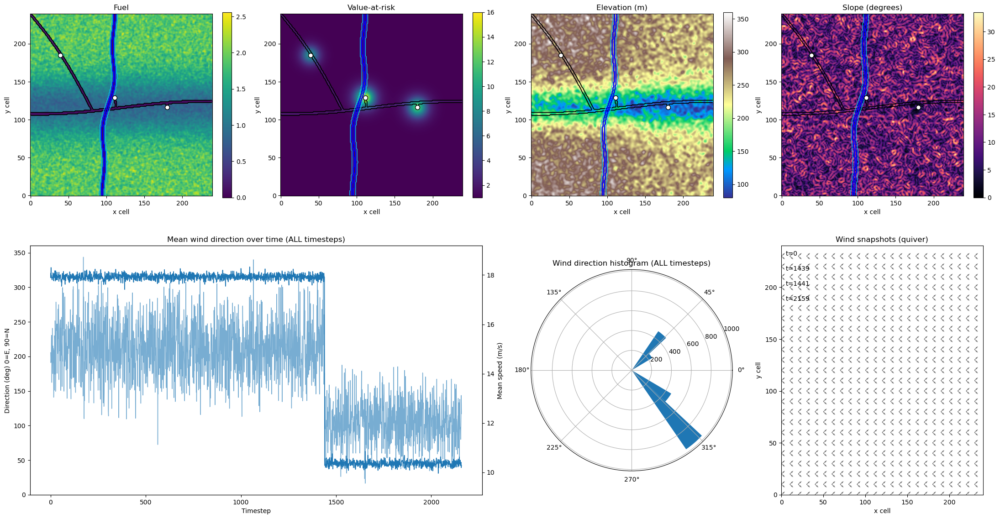

In [3]:

# ==========================================================
# Visualisation (river clearly visible)
# ==========================================================
def plot_env(env, elev_m, slope, town_centers, road_mask, river_mask, riparian_mask, phase1_steps):
    fuel = np.asarray(env.fuel, float)
    value = np.asarray(env.value, float)
    wind = np.asarray(env.wind, float)

    slope = np.asarray(slope)
    slope_deg = np.degrees(np.arctan(np.sqrt(slope[..., 0] ** 2 + slope[..., 1] ** 2)))

    mean_vec = wind.reshape(wind.shape[0], -1, 2).mean(axis=1)
    u = mean_vec[:, 0]
    v = mean_vec[:, 1]
    spd = np.sqrt(u**2 + v**2)
    # Math convention: direction vector points TO (0°=East, 90°=North)
    wdir = (np.degrees(np.arctan2(v, u)) + 360.0) % 360.0

    snaps = [0, max(0, phase1_steps - 1), min(len(wdir) - 1, phase1_steps + 1), len(wdir) - 1]
    snaps = sorted(set(snaps))

    fig = plt.figure(figsize=(22, 12))
    gs = fig.add_gridspec(2, 4)

    def overlay(ax):
        # Roads: black contour
        ax.contour(road_mask.T.astype(float), levels=[0.5], linewidths=1.3, colors="k")
        # Riparian: blue dashed
        ax.contour(riparian_mask.T.astype(float), levels=[0.5], linewidths=1.0, colors="deepskyblue")
        # River channel: solid blue
        ax.contour(river_mask.T.astype(float), levels=[0.5], linewidths=1.8, colors="blue")
        for (ti, tj) in town_centers:
            ax.plot(ti, tj, "wo", ms=7, mec="k")
        ax.set_xlabel("x cell")
        ax.set_ylabel("y cell")

    ax = fig.add_subplot(gs[0, 0])
    im = ax.imshow(fuel.T, origin="lower")
    ax.set_title("Fuel")
    fig.colorbar(im, ax=ax, fraction=0.046)
    overlay(ax)

    ax = fig.add_subplot(gs[0, 1])
    im = ax.imshow(value.T, origin="lower", cmap="viridis")
    ax.set_title("Value-at-risk")
    fig.colorbar(im, ax=ax, fraction=0.046)
    overlay(ax)

    ax = fig.add_subplot(gs[0, 2])
    im = ax.imshow(elev_m.T, origin="lower", cmap="terrain")
    ax.set_title("Elevation (m)")
    fig.colorbar(im, ax=ax, fraction=0.046)
    overlay(ax)

    ax = fig.add_subplot(gs[0, 3])
    im = ax.imshow(slope_deg.T, origin="lower", cmap="magma")
    ax.set_title("Slope (degrees)")
    fig.colorbar(im, ax=ax, fraction=0.046)
    overlay(ax)

    ax = fig.add_subplot(gs[1, 0:2])
    ax.plot(wdir, lw=1.2)
    ax.set_title("Mean wind direction over time (ALL timesteps)")
    ax.set_ylabel("Direction (deg) 0=E, 90=N")
    ax.set_xlabel("Timestep")
    ax.set_ylim(0, 360)
    ax2 = ax.twinx()
    ax2.plot(spd, lw=1.0, alpha=0.6)
    ax2.set_ylabel("Mean speed (m/s)")

    ax = fig.add_subplot(gs[1, 2], projection="polar")
    ax.hist(np.radians(wdir), bins=24)
    ax.set_title("Wind direction histogram (ALL timesteps)")

    ax = fig.add_subplot(gs[1, 3])
    ax.set_title("Wind snapshots (quiver)")
    skip = max(1, env.grid_size[0] // 22)
    XX = np.arange(0, env.grid_size[0], skip)
    YY = np.arange(0, env.grid_size[1], skip)

    for k, s in enumerate(snaps):
        wf = wind[s][::skip, ::skip]
        ax.quiver(XX, YY, wf[..., 0].T, wf[..., 1].T, alpha=0.35)
        ax.text(0.02, 0.98 - 0.06 * k, f"t={s}", transform=ax.transAxes, va="top")

    ax.set_xlim(0, env.grid_size[0])
    ax.set_ylim(0, env.grid_size[1])
    ax.set_xlabel("x cell")
    ax.set_ylabel("y cell")

    plt.tight_layout()

env_realistic_bundle = realistic_env, elev_m, slope, town_centers, road_mask, river_mask, riparian_mask, phase1_steps

plot_env(
    realistic_env,
    elev_m=elev_m,
    slope=slope,
    town_centers=town_centers,
    road_mask=road_mask,
    river_mask=river_mask,
    riparian_mask=riparian_mask,
    phase1_steps=phase1_steps,
)

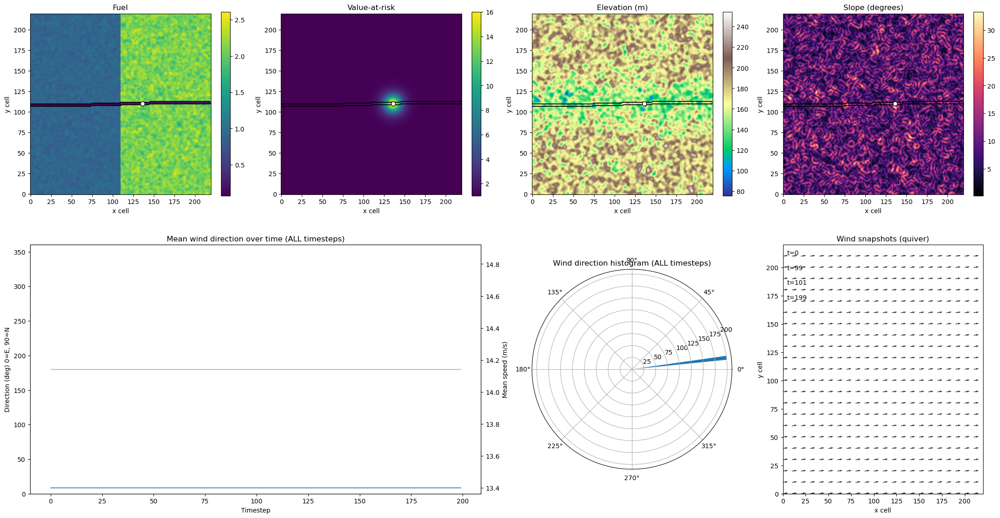

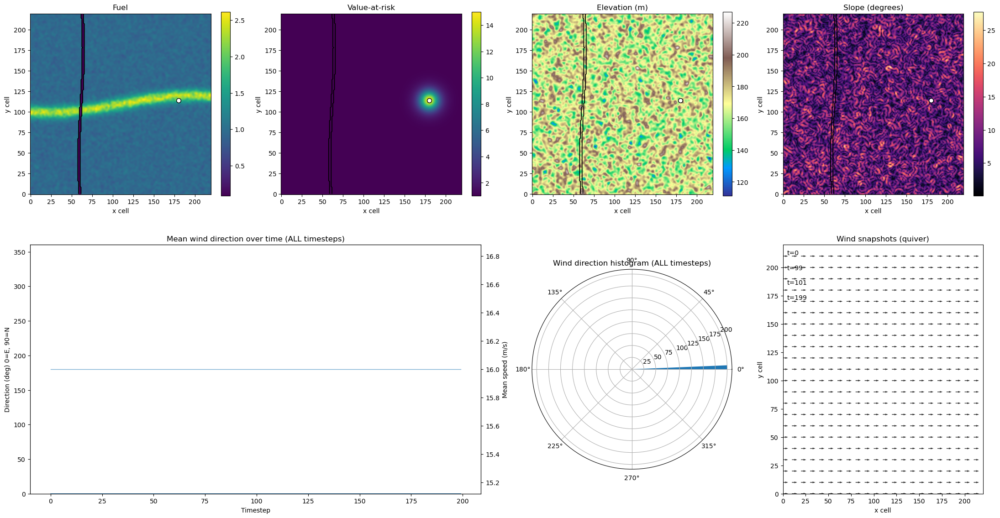

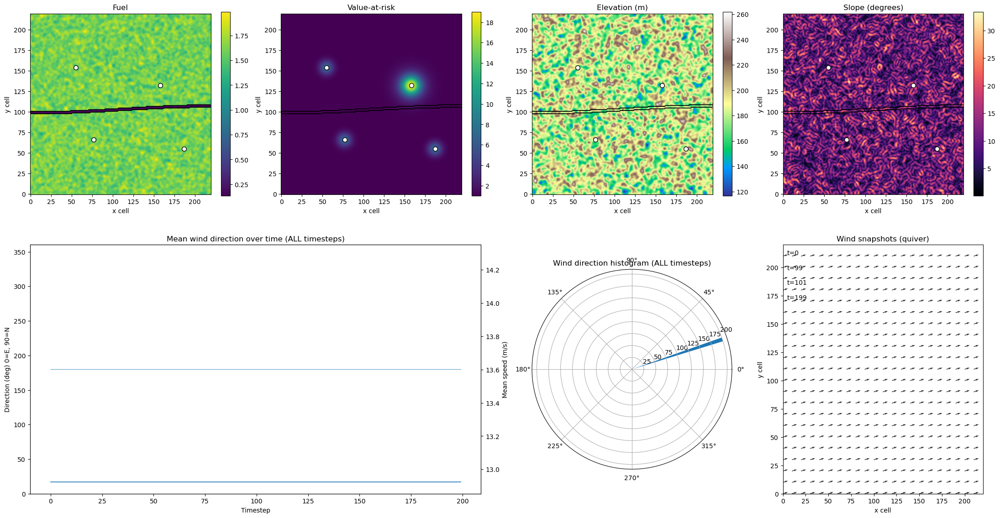

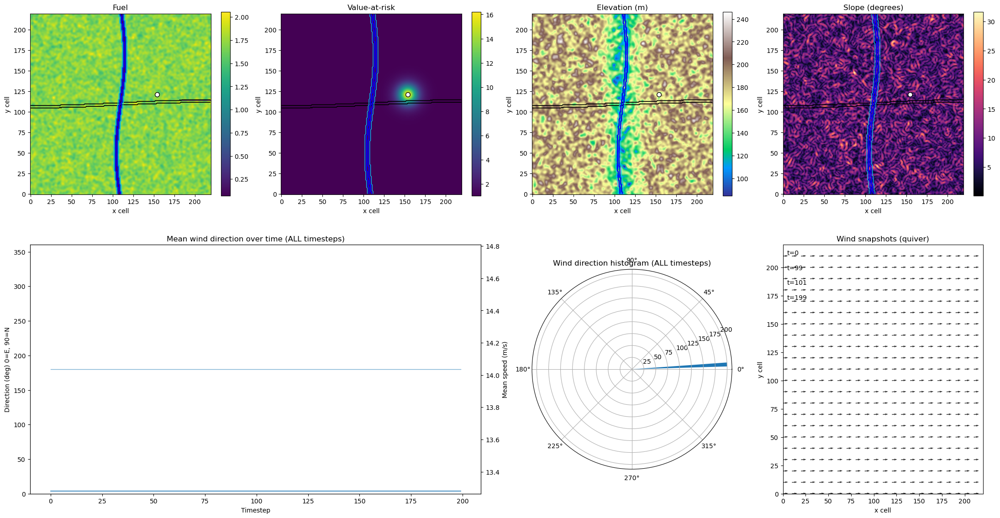

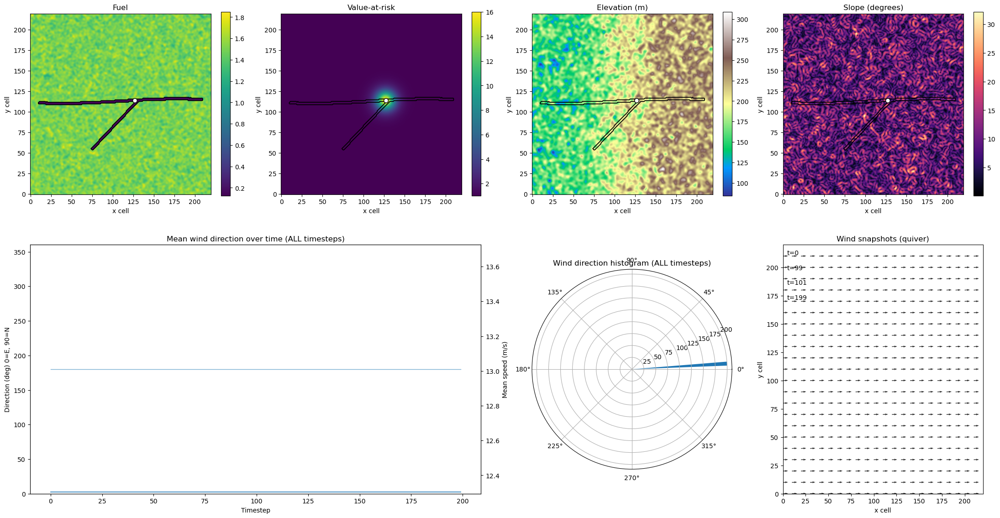

In [4]:
# ==========================================================
# Common helpers + defaults (kept constant across scenarios)
# ==========================================================
def distance_to_curve(X, Y, pts):
    dmin = np.full(X.shape, np.inf, dtype=float)
    for px, py in pts:
        d = np.sqrt((X - px) ** 2 + (Y - py) ** 2)
        dmin = np.minimum(dmin, d)
    return dmin

def smooth_noise(rng, nx, ny, iters=6):
    a = rng.normal(size=(nx, ny))
    for _ in range(iters):
        a = (
            0.40 * a
            + 0.10 * np.roll(a, 1, 0) + 0.10 * np.roll(a, -1, 0)
            + 0.10 * np.roll(a, 1, 1) + 0.10 * np.roll(a, -1, 1)
            + 0.05 * np.roll(np.roll(a, 1, 0), 1, 1)
            + 0.05 * np.roll(np.roll(a, -1, 0), -1, 1)
            + 0.05 * np.roll(np.roll(a, 1, 0), -1, 1)
            + 0.05 * np.roll(np.roll(a, -1, 0), 1, 1)
        )
    return (a - a.mean()) / (a.std() + 1e-9)

def make_base_grids(nx=220, ny=220, domain_km=12.0):
    xs = np.linspace(-3.2, 3.2, nx)[:, None]
    ys = np.linspace(-3.2, 3.2, ny)[None, :]
    X = xs.repeat(ny, axis=1)
    Y = ys.repeat(nx, axis=0)
    dx_m = (domain_km / nx) * 1000.0
    return xs, ys, X, Y, dx_m

def constant_wind(nx, ny, u=12.0, v=3.0):
    # Constant wind (no dir change) so your plot_env works without special handling.
    # Shape: (T, nx, ny, 2) because your plot_env expects time dimension.
    T = 200  # arbitrary timeline length for plotting
    w = np.zeros((T, nx, ny, 2), dtype=float)
    w[..., 0] = u
    w[..., 1] = v
    return w, T // 2  # phase1_steps is only used for snapshot indices

def pack_env(fuel, value, wind, slope, nx, ny, domain_km, dt_s=10.0):
    # Retardant persistence evidence: effective until significant rain event.
    # https://www.perimeter-solutions.com/en/phos-chek-wildfire-home-defense-faqs/
    #
    # MAFFS footprint example: ~1/4 mile long (~0.4 km), ~60 ft wide (~18 m)
    # https://www.af.mil/About-Us/Fact-Sheets/Display/Article/104558/modular-airborne-fire-fighting-system/
    return FireEnv(
        grid_size=(nx, ny),
        domain_km=domain_km,
        fuel=fuel,
        value=value,
        wind=wind,
        slope=slope,  # only matters if you apply the slope patch above
        dt_s=dt_s,
        burn_time_s0=900.0,
        retardant_half_life_s=172800.0,  # long half-life to mimic persistence-until-rain (given exponential decay)
        retardant_k=20.0,
        drop_w_km=0.5,
        drop_h_km=0.60,
        drop_amount=2.0,
        ros_mps=0.5,
        wind_coeff=0.04,
        diag=True,
        avoid_burning_drop=True,
        avoid_drop_p_threshold=0.1,
        ros_future_jitter_frac=0.05,
        wind_coeff_future_jitter_frac=0.005,
    )

# ==========================================================
# FIVE stress-test scenarios (each isolates ONE key factor)
# ==========================================================
# You can showcase these 5 factors in a report because they map to distinct retardant policy challenges:
# 1) Fuel discontinuity ("fuel jump") -> where to place line relative to abrupt ROS change
# 2) Downwind corridor (linear high-fuel) -> line placement to choke a wind-aligned conduit
# 3) Asset cluster vs. single asset (competing priorities) -> allocate drops under scarcity
# 4) River + single bridge + road junction -> defend chokepoints / prevent spotting-like crossing analog
# 5) Slope-driven headfire (upslope run) -> line placement on ridgelines / mid-slope where it matters

def env1_fuel_jump(seed=1):
    """FACTOR: Abrupt fuel transition (grass -> forest) with assets just inside the forest."""
    rng = np.random.default_rng(seed)
    nx = ny = 220
    domain_km = 12.0
    xs, ys, X, Y, dx_m = make_base_grids(nx, ny, domain_km)

    # Terrain: mild valley (keep slopes modest so factor is "fuel jump", not slope)
    elev = 180.0 + 18.0 * smooth_noise(rng, nx, ny, iters=6) - 35.0 * np.exp(-(Y**2) / (2 * 0.55**2))
    dzdx = np.gradient(elev, dx_m, axis=0)
    dzdy = np.gradient(elev, dx_m, axis=1)
    slope = np.stack([dzdx, dzdy], axis=-1)

    # Fuel: sharp jump at x ~ 0 (west grass, east forest)
    fuel = 0.9 * np.ones((nx, ny))
    fuel += 1.2 * (X > 0.0)  # forest side is higher fuel
    fuel *= (1.0 + 0.06 * smooth_noise(rng, nx, ny, iters=3))
    fuel = np.clip(fuel, 0.1, 3.2)

    # Roads: just one highway along valley (minimal)
    t = np.linspace(-3.2, 3.2, 260)
    hw_pts = np.stack([t, 0.05 * np.sin(0.6 * t)], axis=1)
    d_hw = distance_to_curve(X, Y, hw_pts)
    road_mask = d_hw < 0.045

    # No river in this scenario
    river_mask = np.zeros((nx, ny), dtype=bool)
    riparian_mask = np.zeros((nx, ny), dtype=bool)

    # Assets: cluster slightly inside forest side (the "wrong side" of the fuel jump)
    value = np.ones((nx, ny))
    town = (int(nx * 0.62), int(ny * 0.50))
    cx, cy = xs[town[0], 0], ys[0, town[1]]
    r2 = (X - cx) ** 2 + (Y - cy) ** 2
    value += 12.0 * np.exp(-r2 / 0.08) + 3.0 * np.exp(-r2 / 0.25)
    town_centers = [town]

    # Roads reduce fuel (barrier-ish): NWCG S-290.
    # https://training.nwcg.gov/dl/s290/s-290-student-workbook-all.pdf
    fuel *= np.where(road_mask, ROAD_FUEL_FACTOR, 1.0)

    wind, phase1_steps = constant_wind(nx, ny, u=14.0, v=2.0)  # mostly eastward
    env = pack_env(fuel, value, wind, slope, nx, ny, domain_km)
    return env, elev, slope, town_centers, road_mask, river_mask, riparian_mask, phase1_steps


def env2_downwind_corridor(seed=2):
    """FACTOR: A wind-aligned high-fuel corridor (like a gully / stringybark strip) that acts as a fast conduit."""
    rng = np.random.default_rng(seed)
    nx = ny = 220
    domain_km = 12.0
    xs, ys, X, Y, dx_m = make_base_grids(nx, ny, domain_km)

    # Terrain: mostly flat (keep slope secondary)
    elev = 170.0 + 14.0 * smooth_noise(rng, nx, ny, iters=5)
    dzdx = np.gradient(elev, dx_m, axis=0)
    dzdy = np.gradient(elev, dx_m, axis=1)
    slope = np.stack([dzdx, dzdy], axis=-1)

    # Fuel: baseline grass + one narrow corridor of dense fuel aligned with wind (eastward)
    fuel = 0.95 * np.ones((nx, ny))
    corridor = np.exp(-((Y - 0.3 * np.sin(0.6 * X)) ** 2) / (2 * 0.15**2))
    fuel += 1.4 * corridor  # corridor is significantly heavier
    fuel *= (1.0 + 0.05 * smooth_noise(rng, nx, ny, iters=3))
    fuel = np.clip(fuel, 0.1, 3.2)

    # Roads: single north-south road that crosses the corridor (decision point)
    t = np.linspace(-3.2, 3.2, 260)
    rd_pts = np.stack([-1.4 + 0.08 * np.sin(0.8 * t), t], axis=1)
    d_rd = distance_to_curve(X, Y, rd_pts)
    road_mask = d_rd < 0.040

    river_mask = np.zeros((nx, ny), dtype=bool)
    riparian_mask = np.zeros((nx, ny), dtype=bool)

    # Asset: town at corridor "downwind end" (east side), so best heuristic should cut corridor upstream
    value = np.ones((nx, ny))
    town = (int(nx * 0.82), int(ny * 0.52))
    cx, cy = xs[town[0], 0], ys[0, town[1]]
    r2 = (X - cx) ** 2 + (Y - cy) ** 2
    value += 11.0 * np.exp(-r2 / 0.09) + 3.0 * np.exp(-r2 / 0.28)
    town_centers = [town]

    fuel *= np.where(road_mask, ROAD_FUEL_FACTOR, 1.0)  # low-prob burnable roads
    wind, phase1_steps = constant_wind(nx, ny, u=16.0, v=0.0)  # strong due-east: isolates corridor effect
    env = pack_env(fuel, value, wind, slope, nx, ny, domain_km)
    return env, elev, slope, town_centers, road_mask, river_mask, riparian_mask, phase1_steps


def env3_asset_cluster_tradeoff(seed=3):
    """FACTOR: Competing assets (one big cluster vs scattered singles) under the same wind."""
    rng = np.random.default_rng(seed)
    nx = ny = 220
    domain_km = 12.0
    xs, ys, X, Y, dx_m = make_base_grids(nx, ny, domain_km)

    # Terrain: gentle hills (not dominant)
    elev = 185.0 + 20.0 * smooth_noise(rng, nx, ny, iters=6)
    dzdx = np.gradient(elev, dx_m, axis=0)
    dzdy = np.gradient(elev, dx_m, axis=1)
    slope = np.stack([dzdx, dzdy], axis=-1)

    # Fuel: fairly uniform forest-ish with mild patchiness (so choice is about assets, not fuel)
    fuel = 1.6 * np.ones((nx, ny))
    fuel *= (1.0 + 0.06 * smooth_noise(rng, nx, ny, iters=4))
    fuel = np.clip(fuel, 0.2, 3.2)

    # Roads: minimal (just a highway)
    t = np.linspace(-3.2, 3.2, 260)
    hw_pts = np.stack([t, -0.2 + 0.12 * np.sin(0.5 * t)], axis=1)
    d_hw = distance_to_curve(X, Y, hw_pts)
    road_mask = d_hw < 0.045

    river_mask = np.zeros((nx, ny), dtype=bool)
    riparian_mask = np.zeros((nx, ny), dtype=bool)

    # Value: one dense cluster + three isolated assets
    value = np.ones((nx, ny))

    # Cluster (like a peri-urban interface)
    cluster = (int(nx * 0.72), int(ny * 0.60))
    cx, cy = xs[cluster[0], 0], ys[0, cluster[1]]
    r2 = (X - cx) ** 2 + (Y - cy) ** 2
    value += 14.0 * np.exp(-r2 / 0.10) + 4.0 * np.exp(-r2 / 0.32)

    # Isolated assets (e.g., critical infrastructure)
    singles = [
        (int(nx * 0.35), int(ny * 0.30)),
        (int(nx * 0.25), int(ny * 0.70)),
        (int(nx * 0.85), int(ny * 0.25)),
    ]
    for (i, j) in singles:
        cx, cy = xs[i, 0], ys[0, j]
        r2 = (X - cx) ** 2 + (Y - cy) ** 2
        value += 6.0 * np.exp(-r2 / 0.06)

    town_centers = [cluster] + singles

    fuel *= np.where(road_mask, ROAD_FUEL_FACTOR, 1.0)
    wind, phase1_steps = constant_wind(nx, ny, u=13.0, v=4.0)  # NE-ish
    env = pack_env(fuel, value, wind, slope, nx, ny, domain_km)
    return env, elev, slope, town_centers, road_mask, river_mask, riparian_mask, phase1_steps


def env4_bridge_chokepoint(seed=4):
    """FACTOR: River barrier with a single 'bridge' crossing (road) -> defend chokepoint / prevent crossing."""
    rng = np.random.default_rng(seed)
    nx = ny = 220
    domain_km = 12.0
    xs, ys, X, Y, dx_m = make_base_grids(nx, ny, domain_km)

    # Terrain: valley aligned with river to make the barrier meaningful
    elev = 185.0 + 16.0 * smooth_noise(rng, nx, ny, iters=6) - 55.0 * np.exp(-(X**2) / (2 * 0.40**2))
    dzdx = np.gradient(elev, dx_m, axis=0)
    dzdy = np.gradient(elev, dx_m, axis=1)
    slope = np.stack([dzdx, dzdy], axis=-1)

    # River: vertical near x=0
    t = np.linspace(-3.2, 3.2, 260)
    river_pts = np.stack([0.0 + 0.15 * np.sin(0.9 * t), t], axis=1)
    d_river = distance_to_curve(X, Y, river_pts)
    river_mask = d_river < 0.035
    riparian_mask = d_river < 0.095

    # Carve channel a bit
    elev = elev - 12.0 * np.exp(-(d_river**2) / (2 * 0.030**2))

    # Fuel: forest on both sides, but river is near-zero fuel
    fuel = 1.7 * np.ones((nx, ny))
    fuel *= (1.0 + 0.05 * smooth_noise(rng, nx, ny, iters=4))
    fuel *= np.where(river_mask, 0.05, 1.0)
    fuel *= np.where(riparian_mask & (~river_mask), 0.75, 1.0)
    fuel = np.clip(fuel, 0.05, 3.2)

    # Roads: one E-W highway, but only one “bridge” segment is allowed to cross the river:
    # We model this by making the road exist everywhere, but reduce its "barrier effect" except at bridge location
    # (so the heuristic sees a single meaningful crossing area).
    hw_pts = np.stack([t, 0.10 * np.sin(0.5 * t)], axis=1)
    d_hw = distance_to_curve(X, Y, hw_pts)
    road_mask = d_hw < 0.045

    # Define bridge zone near y ~ 0.3 (only place where crossing is plausible)
    bridge_zone = np.exp(-((Y - 0.3) ** 2) / (2 * 0.18**2)) > 0.6
    # “Road barrier fuel reduction” applies strongly only near bridge zone
    fuel *= np.where(road_mask & bridge_zone, ROAD_FUEL_FACTOR, 1.0)

    # Assets: valuable town on the east side just downwind of bridge
    value = np.ones((nx, ny))
    town = (int(nx * 0.70), int(ny * 0.55))
    cx, cy = xs[town[0], 0], ys[0, town[1]]
    r2 = (X - cx) ** 2 + (Y - cy) ** 2
    value += 12.0 * np.exp(-r2 / 0.09) + 3.2 * np.exp(-r2 / 0.28)
    town_centers = [town]

    # Recompute slope after carving
    dzdx = np.gradient(elev, dx_m, axis=0)
    dzdy = np.gradient(elev, dx_m, axis=1)
    slope = np.stack([dzdx, dzdy], axis=-1)

    wind, phase1_steps = constant_wind(nx, ny, u=14.0, v=1.0)  # mostly eastward
    env = pack_env(fuel, value, wind, slope, nx, ny, domain_km)
    return env, elev, slope, town_centers, road_mask, river_mask, riparian_mask, phase1_steps


def env5_upslope_run(seed=5):
    """FACTOR: Strong slope alignment with wind (upslope run) -> best line placement is not just downwind."""
    rng = np.random.default_rng(seed)
    nx = ny = 220
    domain_km = 12.0
    xs, ys, X, Y, dx_m = make_base_grids(nx, ny, domain_km)

    # Terrain: a broad hillside rising to the east + a mid-slope bench (where towns typically sit)
    elev = 150.0 + 80.0 * (1.0 / (1.0 + np.exp(-(X + 0.3) / 0.55)))  # rises with x
    elev += 18.0 * smooth_noise(rng, nx, ny, iters=6)
    # Create a bench (flatter strip) around x ~ 0.6
    elev -= 18.0 * np.exp(-((X - 0.6) ** 2) / (2 * 0.20**2))

    dzdx = np.gradient(elev, dx_m, axis=0)
    dzdy = np.gradient(elev, dx_m, axis=1)
    slope = np.stack([dzdx, dzdy], axis=-1)

    # Fuel: fairly uniform (so the factor is slope), mild patchiness
    fuel = 1.5 * np.ones((nx, ny))
    fuel *= (1.0 + 0.05 * smooth_noise(rng, nx, ny, iters=3))
    fuel = np.clip(fuel, 0.2, 3.2)

    # Road: contour road along the bench (common in hilly terrain), plus one spur
    t = np.linspace(-3.2, 3.2, 260)
    bench_y = 0.25 * np.sin(0.5 * t)
    bench_x = 0.6 + 0.08 * np.sin(0.9 * t)
    bench_rd = np.stack([bench_x, bench_y + t * 0.0], axis=1)  # mostly N-S variation removed (simple)
    # Actually make it run E-W-ish across the map:
    bench_rd = np.stack([t * 0.9, 0.10 + 0.08 * np.sin(0.7 * t)], axis=1)
    d_bench = distance_to_curve(X, Y, bench_rd)

    spur = np.stack([np.linspace(-1.0, 0.6, 120), np.linspace(-1.6, 0.1, 120)], axis=1)
    d_spur = distance_to_curve(X, Y, spur)

    road_mask = (d_bench < 0.045) | (d_spur < 0.040)

    river_mask = np.zeros((nx, ny), dtype=bool)
    riparian_mask = np.zeros((nx, ny), dtype=bool)

    # Town on the bench (flat-ish), threatened by upslope + wind
    value = np.ones((nx, ny))
    town = (int(nx * 0.58), int(ny * 0.52))
    cx, cy = xs[town[0], 0], ys[0, town[1]]
    r2 = (X - cx) ** 2 + (Y - cy) ** 2
    value += 12.0 * np.exp(-r2 / 0.09) + 3.0 * np.exp(-r2 / 0.28)
    town_centers = [town]

    fuel *= np.where(road_mask, ROAD_FUEL_FACTOR, 1.0)

    # Wind blowing upslope (to +x) so slope+wind compound (CFA rule becomes decisive if patched)
    wind, phase1_steps = constant_wind(nx, ny, u=13.0, v=0.5)
    env = pack_env(fuel, value, wind, slope, nx, ny, domain_km)
    return env, elev, slope, town_centers, road_mask, river_mask, riparian_mask, phase1_steps


# ==========================================================
# Create the 5 environments
# Each entry is directly compatible with your plot_env(...)
# ==========================================================
env_bundle_1 = env1_fuel_jump()
env_bundle_2 = env2_downwind_corridor()
env_bundle_3 = env3_asset_cluster_tradeoff()
env_bundle_4 = env4_bridge_chokepoint()
env_bundle_5 = env5_upslope_run()

# 1) "Fuel jump discontinuity"
plot_env(*env_bundle_1)
# 2) "Downwind corridor conduit"
plot_env(*env_bundle_2)
# 3) "Asset cluster vs scattered assets"
plot_env(*env_bundle_3)
# 4) "River barrier with single bridge chokepoint"
plot_env(*env_bundle_4)
# 5) "Upslope run (slope + wind compounding)"
plot_env(*env_bundle_5)


## Bayesian Optimisation Experiments (Heuristics + BO + Sensitivity + Multifidelity)

This section adds a **repeatable experiment harness** you can reuse across all scenarios:

- **Heuristic-only baselines** (single heuristic and simple mixtures)
- **Bayesian optimisation (BO)** with tqdm progress bars
- **Multifidelity** via the BO Monte‑Carlo parameter `n_sims` (cheap → expensive)
- **Sensitivity analysis** for report figures (one‑at‑a‑time + tornado plot)

> **Important:** the "upslope" scenario only truly tests slope-driven behaviour if you applied the CFA slope patch described earlier.

In [5]:
# =========================
# Experiment harness imports
# =========================
from dataclasses import dataclass
from tqdm.auto import tqdm
import numpy as np
import matplotlib.pyplot as plt

# These live in your project (the same way you imported FireEnv earlier).
# If your module paths differ, change the imports here ONCE.
try:
    from fire_model.ca import CAFireModel
    from fire_model.bo import RetardantDropBayesOpt, expected_improvement
except Exception as e:
    raise ImportError(
        "Could not import fire_model.ca / fire_model.bo. "
        "Make sure bo.py and ca.py are inside your fire_model/ package."
    ) from e

In [6]:

# ==========================================================
# Robust imports (so the notebook runs from any directory)
# ==========================================================
import os, sys

# If you keep bo.py / ca.py under fire_model/, this will already work.
# If you are running this notebook from a flat directory (bo.py, ca.py next to it),
# this fallback makes imports succeed.

try:
    from fire_model.bo import RetardantDropBayesOpt, expected_improvement
    from fire_model.ca import CAFireModel, FireState
except Exception:
    here = os.getcwd()
    sys.path.insert(0, here)
    # Optional: if notebook is in a subdir, also add its parent.
    sys.path.insert(0, os.path.dirname(here))
    from bo import RetardantDropBayesOpt, expected_improvement
    from ca import CAFireModel, FireState

print("Imports OK:", RetardantDropBayesOpt, CAFireModel)


Imports OK: <class 'fire_model.bo.RetardantDropBayesOpt'> <class 'fire_model.ca.CAFireModel'>


### Key knobs you will change (for different visuals / runtime)

**Runtime**
- `BO_N_INIT`: initial samples before BO starts (8–15 typical)
- `BO_N_ITERS`: BO iterations (20–60 typical)
- `BO_N_CANDIDATES`: candidate points per BO iter (2k–10k typical)
- `FIDELITY_LOW / FIDELITY_HIGH`: `n_sims` (MC runs) for cheap vs expensive evaluation  
  - low: 8–20 (fast)
  - high: 40–120 (report-quality)

**Fire model / evaluation**
- `EVOLUTION_TIME_S`: how long to simulate after applying drops (e.g. 1–3 hours)
- `IGNITION_RADIUS_KM`: initial ignition size (e.g. 0.15–0.35 km)

**Plot styling**
- In `plot_env(...)`: increase readability by raising `skip` (fewer arrows) and decreasing `scale`.

Recommended for coursework runs:
- Draft: `FIDELITY_LOW=10`, `BO_N_ITERS=20`
- Final figures: `FIDELITY_LOW=15`, `FIDELITY_HIGH=80`, `BO_N_ITERS=40`

In [7]:
# ==========================================================
# 1) Create an ignition point (upwind of assets by default)
# ==========================================================
def choose_ignition_upwind(env, town_centers, wind_uv, offset_cells=55):
    """Pick an ignition center roughly upwind of the main (highest-value) town center.

    wind_uv: (u,v) where u=+x (east), v=+y (north). Upwind is opposite direction.
    """
    nx, ny = env.grid_size
    u, v = wind_uv
    # If user passed multiple towns, assume first is "main" town for ignition planning.
    ti, tj = town_centers[0]
    # Upwind offset (opposite direction of wind)
    di = int(np.round(-u / (np.sqrt(u*u + v*v) + 1e-9) * offset_cells))
    dj = int(np.round(-v / (np.sqrt(u*u + v*v) + 1e-9) * offset_cells))
    ci = int(np.clip(ti + di, 5, nx - 6))
    cj = int(np.clip(tj + dj, 5, ny - 6))
    return (ci, cj)

# ==========================================================
# 2) Build BO object for a scenario (model + init firestate)
# ==========================================================
@dataclass
class ScenarioBundle:
    name: str
    env: object
    elev_m: np.ndarray
    slope: np.ndarray
    town_centers: list
    road_mask: np.ndarray
    river_mask: np.ndarray
    riparian_mask: np.ndarray
    phase1_steps: int

def make_bo_for_scenario(
    bundle: ScenarioBundle,
    *,
    n_drones=1,
    evolution_time_s=2.0 * 3600,
    n_sims=15,
    ignition_radius_km=0.25,
    ignition_center=None,
    rng_seed=0,
    drop_time_s=15 * 60,
    search_grid_evolution_time_s=15 * 60,
):
    model = CAFireModel(bundle.env, seed=rng_seed)

    # wind is (T,nx,ny,2) in your scenarios; take mean of t=0 for direction
    w0 = np.asarray(bundle.env.wind)[0]
    wind_uv = (float(w0[..., 0].mean()), float(w0[..., 1].mean()))

    if ignition_center is None:
        ignition_center = choose_ignition_upwind(bundle.env, bundle.town_centers, wind_uv)

    init_state = model.init_state_batch(
        n_sims=n_sims,
        center=ignition_center,
        radius_km=ignition_radius_km,
    )

    opt = RetardantDropBayesOpt(
        fire_model=model,
        init_firestate=init_state,
        n_drones=n_drones,
        evolution_time_s=evolution_time_s,
        n_sims=n_sims,
        fire_boundary_probability=0.25,
        rng=np.random.default_rng(rng_seed),
        drop_time_s=drop_time_s,
        search_grid_evolution_time_s=search_grid_evolution_time_s,
    )
    return opt, ignition_center, wind_uv

# ==========================================================
# 3) Heuristic-only baselines (single + simple mixtures)
# ==========================================================
HEURISTICS = ["boundary", "head_flank", "point_protection", "confine"]

def heuristic_specs_for_scenario(scenario_name: str):
    """Return a small set of heuristic specs suited to the scenario.

    Each spec is a dict with keys:
      - name: label for plots/tables
      - heuristic_modes: list[str]
      - heuristic_allocations: dict or None
    """
    # Simple mixtures (weights sum to 1) are expressed via heuristic_allocations
    # inside bo.py's sample_heuristic_theta. Keep these easy to explain.
    mix_hf_boundary = {
        "head_flank": 0.6,
        "boundary": 0.4,
    }
    mix_point_boundary = {
        "point_protection": 0.65,
        "boundary": 0.35,
    }

    specs = [
        {"name": "boundary", "heuristic_modes": ["boundary"], "heuristic_allocations": None},
        {"name": "head_flank", "heuristic_modes": ["head_flank"], "heuristic_allocations": None},
        {"name": "point_protection", "heuristic_modes": ["point_protection"], "heuristic_allocations": None},
        #{"name": "confine", "heuristic_modes": ["confine"], "heuristic_allocations": None},
        #{"name": "mix(head_flank,boundary)", "heuristic_modes": ["head_flank", "boundary"], "heuristic_allocations": mix_hf_boundary},
        #{"name": "mix(point,boundary)", "heuristic_modes": ["point_protection", "boundary"], "heuristic_allocations": mix_point_boundary},
    ]

    # Scenario-specific pruning (keep only those that “make sense”)
    s = scenario_name.lower()
    if "asset" in s:
        # asset triage: point_protection variants are most meaningful
        return [sp for sp in specs if ("point" in sp["name"] or sp["name"] in ["boundary", "confine"])]
    if "corridor" in s:
        # corridor: head_flank + boundary is a strong baseline; confine sometimes too.
        return [sp for sp in specs if sp["name"] in ["head_flank", "boundary", "mix(head_flank,boundary)", "confine"]]
    if "bridge" in s or "river" in s:
        # chokepoint: boundary/confine + point protection
        return [sp for sp in specs if sp["name"] in ["boundary", "confine", "point_protection", "mix(point,boundary)"]]
    if "upslope" in s:
        # upslope: head_flank/boundary/confine
        return [sp for sp in specs if sp["name"] in ["head_flank", "boundary", "mix(head_flank,boundary)", "confine"]]

    return specs

def run_heuristic_baselines(
    opt: RetardantDropBayesOpt,
    specs,
    *,
    n_samples_per_spec=40,
    init_kwargs=None,
    desc="Heuristics",
    K_grid=500,
    boundary_field="affected",
):
    """Evaluate heuristics by sampling candidate thetas and scoring them."""
    # Ensure search grid exists for heuristic sampling.
    opt.setup_search_grid(K=K_grid, boundary_field=boundary_field)

    init_kwargs = init_kwargs or {}
    rows = []
    for sp in specs:
        best_y = np.inf
        best_theta = None
        ys = []
        for _ in tqdm(range(n_samples_per_spec), desc=f"{desc}: {sp['name']}"):
            th = opt.sample_heuristic_theta(
                1,
                heuristic_modes=sp["heuristic_modes"],
                heuristic_allocations=sp["heuristic_allocations"],
                **init_kwargs,
            )
            th = np.atleast_2d(th)[0]
            y = opt.expected_value_burned_area(th)
            print(y)
            ys.append(y)
            if y < best_y:
                best_y = y
                best_theta = th
        rows.append(
            {
                "heuristic": sp["name"],
                "best_obj": float(best_y),
                "mean_obj": float(np.mean(ys)),
                "std_obj": float(np.std(ys)),
                "best_theta": best_theta,
            }
        )
    # sort by best achieved
    rows = sorted(rows, key=lambda r: r["best_obj"])
    return rows

# ==========================================================
# 4) Bayesian optimisation with tqdm (copy of bo.py logic, simplified)
# ==========================================================
def run_bayes_opt_tqdm(
    opt: RetardantDropBayesOpt,
    *,
    n_init=10,
    n_iters=30,
    n_candidates=4000,
    xi=0.01,
    K_grid=500,
    boundary_field="affected",
    init_strategy="heuristic",  # "random", "random_mask", "heuristic"
    init_heuristic_kwargs=None,
    candidate_strategy="mixed",  # "random", "random_mask", "qmc", "mixed"
    candidate_qmc="sobol",
    candidate_local_frac=0.6,
    candidate_local_top_k=3,
    candidate_local_sigma_cells=3.0,
    candidate_local_sigma_phi_rad=np.deg2rad(15.0),
    candidate_local_resample_phi_prob=0.05,
    use_ard_kernel=False,
    seed=0,
):
    """BO loop with a progress bar, returning (best_theta, history dict).

    Notes:
    - Uses bo.py's expected_improvement(...) for acquisition.
    - Uses opt.sample_* methods for candidate generation, so it respects mask/boundary choices.
    """
    from sklearn.gaussian_process import GaussianProcessRegressor
    from sklearn.gaussian_process.kernels import Matern, ConstantKernel, WhiteKernel

    rng = np.random.default_rng(seed)

    # Ensure search grid exists
    opt.setup_search_grid(K=K_grid, boundary_field=boundary_field)

    # ---------- init sample set ----------
    if init_strategy == "random":
        thetas = opt.sample_qmc_theta(n_init, method=candidate_qmc)
    elif init_strategy == "random_mask":
        thetas = opt.sample_random_theta_on_mask(n_init)
    elif init_strategy == "heuristic":
        init_heuristic_kwargs = init_heuristic_kwargs or {}
        thetas = opt.sample_initial_thetas(
            n_init,
            strategy="heuristic",
            heuristic_kwargs=init_heuristic_kwargs,
        )
    else:
        raise ValueError(f"Unknown init_strategy={init_strategy}")

    thetas = np.atleast_2d(thetas)

    X = np.stack([opt.theta_to_gp_features(th) for th in thetas], axis=0)
    y = np.array([opt.expected_value_burned_area(th) for th in tqdm(thetas, desc="BO init eval")], dtype=float)

    thetas = [th.copy() for th in thetas]

    y_best = float(np.min(y))
    best_theta = thetas[int(np.argmin(y))]

    # ---------- GP model ----------
    dim = X.shape[1]
    if use_ard_kernel:
        # ARD: different lengthscale per dimension
        matern = Matern(length_scale=np.ones(dim), length_scale_bounds=(1e-2, 1e2), nu=2.5)
    else:
        matern = Matern(length_scale=1.0, length_scale_bounds=(1e-2, 1e2), nu=2.5)

    kernel = ConstantKernel(1.0, (1e-3, 1e3)) * matern + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-6, 1e2))
    gp = GaussianProcessRegressor(kernel=kernel, normalize_y=True, n_restarts_optimizer=2, random_state=None)

    hist = {"y_best": [y_best], "y_next": [], "theta_best": [best_theta]}

    # ---------- BO iterations ----------
    for _ in tqdm(range(n_iters), desc="Bayesian optimisation"):
        gp.fit(X, y)
        # Candidate generation
        cstrat = str(candidate_strategy).lower().strip()
        if cstrat == "random":
            cand = opt.sample_qmc_theta(n_candidates, method=candidate_qmc)
        elif cstrat == "random_mask":
            cand = opt.sample_random_theta_on_mask(n_candidates)
        elif cstrat == "qmc":
            cand = opt.sample_qmc_theta(n_candidates, method=candidate_qmc)
        elif cstrat == "mixed":
            n_local = int(np.round(n_candidates * float(np.clip(candidate_local_frac, 0.0, 1.0))))
            n_global = n_candidates - n_local

            globals_ = opt.sample_qmc_theta(n_global, method=candidate_qmc)
            # pick anchors among best observed
            top_k = int(np.clip(int(candidate_local_top_k), 1, len(y)))
            anchor_idx = np.argsort(y)[:top_k]
            anchors = [thetas[i] for i in anchor_idx]

            locals_ = []
            for _a in anchors:
                locals_.append(
                    opt.sample_local_theta_on_mask(
                        n=max(1, n_local // top_k),
                        anchors_theta=_a,
                        sigma_cells=candidate_local_sigma_cells,
                        sigma_phi_rad=candidate_local_sigma_phi_rad,
                        resample_phi_prob=candidate_local_resample_phi_prob,
                    )
                )
            locals_ = np.concatenate(locals_, axis=0) if len(locals_) else np.zeros((0, opt.dim))
            cand = np.concatenate([globals_, locals_], axis=0)
        else:
            raise ValueError(f"Unknown candidate_strategy={candidate_strategy}")

        Xc = np.stack([opt.theta_to_gp_features(th) for th in cand], axis=0)
        ei = expected_improvement(Xc, gp, y_best=y_best, xi=xi)
        th_next = cand[int(np.argmax(ei))]

        y_next = float(opt.expected_value_burned_area(th_next))

        # update dataset
        X = np.vstack([X, opt.theta_to_gp_features(th_next)[None, :]])
        y = np.append(y, y_next)
        thetas.append(th_next)

        if y_next < y_best:
            y_best = y_next
            best_theta = th_next

        hist["y_next"].append(y_next)
        hist["y_best"].append(y_best)
        hist["theta_best"].append(best_theta)

    return best_theta, hist

# ==========================================================
# 5) Multifidelity (cheap BO → expensive validation)
# ==========================================================
def multifidelity_bo(
    bundle: ScenarioBundle,
    *,
    n_drones=3,
    evolution_time_s=2.0*3600,
    ignition_radius_km=0.25,
    ignition_center=None,
    fidelity_low=12,
    fidelity_high=80,
    bo_kwargs=None,
    seed=0,
    top_k_validate=5,
    drop_time_s=15 * 60,
    search_grid_evolution_time_s=15 * 60,
):
    bo_kwargs = bo_kwargs or {}

    # Cheap optimiser
    opt_low, ign, wind_uv = make_bo_for_scenario(
        bundle,
        n_drones=n_drones,
        evolution_time_s=evolution_time_s,
        n_sims=fidelity_low,
        ignition_radius_km=ignition_radius_km,
        ignition_center=ignition_center,
        rng_seed=seed,
        drop_time_s=drop_time_s,
        search_grid_evolution_time_s=search_grid_evolution_time_s,
    )

    best_theta_low, hist = run_bayes_opt_tqdm(opt_low, seed=seed, **bo_kwargs)

    # Re-score top K thetas at high fidelity (more MC runs)
    opt_high, _, _ = make_bo_for_scenario(
        bundle,
        n_drones=n_drones,
        evolution_time_s=evolution_time_s,
        n_sims=fidelity_high,
        ignition_radius_km=ignition_radius_km,
        ignition_center=ign,
        rng_seed=seed+1,
    )
    opt_high.setup_search_grid(K=bo_kwargs.get('K_grid', 500), boundary_field=bo_kwargs.get('boundary_field', 'affected'))

    # Take top candidates seen during BO (the theta_best trace is a simple proxy)
    unique = []
    for th in hist["theta_best"][::-1]:
        if not any(np.allclose(th, u) for u in unique):
            unique.append(th)
        if len(unique) >= top_k_validate:
            break

    rows = []
    for i, th in enumerate(tqdm(unique, desc="High-fidelity validation")):
        y_hi = float(opt_high.expected_value_burned_area(th))
        rows.append({"rank_proxy": i, "obj_high": y_hi, "theta": th})

    rows = sorted(rows, key=lambda r: r["obj_high"])
    return rows[0]["theta"], hist, rows, ign, wind_uv, opt_low, opt_high

# ==========================================================
# 6) Sensitivity analysis (report figure)
# ==========================================================
def tornado_sensitivity(opt, theta_best, frac=0.10):
    """Tornado plot: +/- frac perturbation per theta dimension."""
    base = float(opt.expected_value_burned_area(theta_best))
    deltas = []
    for k in range(len(theta_best)):
        th_p = theta_best.copy()
        th_m = theta_best.copy()
        # multiplicative perturbation; keep angles stable by additive perturbation for phi
        if (k % 3) == 2:  # phi component
            th_p[k] = th_p[k] + np.deg2rad(15.0)
            th_m[k] = th_m[k] - np.deg2rad(15.0)
        else:
            th_p[k] = th_p[k] * (1.0 + frac)
            th_m[k] = th_m[k] * (1.0 - frac)

        y_p = float(opt.expected_value_burned_area(th_p))
        y_m = float(opt.expected_value_burned_area(th_m))
        # best-case improvement and worst-case degradation vs base
        deltas.append((k, y_m - base, y_p - base))

    # Sort by max absolute effect
    deltas.sort(key=lambda t: max(abs(t[1]), abs(t[2])), reverse=True)
    return base, deltas

def plot_tornado(base, deltas, title="Sensitivity (tornado)"):
    ks = [d[0] for d in deltas]
    lo = [d[1] for d in deltas]
    hi = [d[2] for d in deltas]

    y = np.arange(len(ks))
    plt.figure(figsize=(8, max(4, 0.35*len(ks))))
    plt.barh(y, hi)
    plt.barh(y, lo)
    plt.axvline(0.0)
    plt.yticks(y, [f"theta[{k}]" for k in ks])
    plt.title(title + f"  (base={base:.2f})")
    plt.xlabel("Δ objective (value burned area)")
    plt.tight_layout()

def plot_bo_history(hist, title="BO convergence"):
    ybest = np.asarray(hist["y_best"], float)
    ynext = np.asarray(hist["y_next"], float) if len(hist["y_next"]) else None
    plt.figure(figsize=(8,4))
    plt.plot(ybest, lw=2)
    if ynext is not None:
        plt.scatter(np.arange(1, len(ybest)), ynext, s=10, alpha=0.6)
    plt.title(title)
    plt.xlabel("Iteration")
    plt.ylabel("Best objective so far")
    plt.tight_layout()


### Run BO + heuristics for one scenario

This is the workflow you’ll use repeatedly:

1) Create a `ScenarioBundle` from one of your environment constructors  
2) Run heuristic baselines  
3) Run multifidelity BO (cheap → expensive)  
4) Produce plots for the report (BO convergence + tornado sensitivity)

In [8]:
# ==========================================================
# Example: plug one of your env bundles into the harness
# ==========================================================
# NOTE: these variables already exist earlier in the notebook:
#   env_bundle_1, env_bundle_2, ... returned as:
#   (env, elev_m, slope, town_centers, road_mask, river_mask, riparian_mask, phase1_steps)

def bundle_from_tuple(name, t):
    env, elev_m, slope, towns, roads, river, riparian, phase = t
    return ScenarioBundle(
        name=name,
        env=env,
        elev_m=elev_m,
        slope=slope,
        town_centers=towns,
        road_mask=roads,
        river_mask=river,
        riparian_mask=riparian,
        phase1_steps=phase,
    )

SCENARIOS = [
    bundle_from_tuple("Fuel jump discontinuity", env_bundle_1),
    bundle_from_tuple("Downwind corridor conduit", env_bundle_2),
    bundle_from_tuple("Asset cluster vs scattered assets", env_bundle_3),
    bundle_from_tuple("River barrier + single bridge chokepoint", env_bundle_4),
    bundle_from_tuple("Upslope run (slope + wind)", env_bundle_5),
    bundle_from_tuple("Realistic environment", env_realistic_bundle),
]

# ---- fast settings for interactive testing ----
BO_N_INIT = 6
BO_N_ITERS = 10
BO_N_CANDIDATES = 800
FIDELITY_LOW = 6
FIDELITY_HIGH = 20
DROP_TIME_S = 15 * 60
SEARCH_GRID_EVOLUTION_TIME_S = 15 * 60
EVOLUTION_TIME_S = 15 * 60
IGNITION_RADIUS_KM = 0.25

# Pick one scenario index to run interactively:
SCENARIO_IDX = 5  # change this (0..5)

bundle = SCENARIOS[SCENARIO_IDX]
print("Scenario:", bundle.name)

# --- BO multifidelity (cheap BO, expensive validate) ---
bo_kwargs = dict(
    n_init=BO_N_INIT,
    n_iters=BO_N_ITERS,
    n_candidates=BO_N_CANDIDATES,
    xi=0.01,
    init_strategy="heuristic",
    init_heuristic_kwargs=dict(
        # tweak these for different behaviours:
        wind_bias=2.0,
        value_bias=0.8,
        phi_jitter_rad=np.deg2rad(10.0),
    ),
    candidate_strategy="mixed",
    candidate_qmc="sobol",
    candidate_local_frac=0.65,
    candidate_local_top_k=3,
    candidate_local_sigma_cells=3.0,
    candidate_local_sigma_phi_rad=np.deg2rad(12.0),
)
"""
best_theta_hi, hist, hi_rows, ign, wind_uv, opt_low, opt_high = multifidelity_bo(
    bundle,
    n_drones=10,
    evolution_time_s=EVOLUTION_TIME_S,
    ignition_radius_km=IGNITION_RADIUS_KM,
    fidelity_low=FIDELITY_LOW,
    fidelity_high=FIDELITY_HIGH,
    bo_kwargs=bo_kwargs,
    seed=0,
    top_k_validate=6,
)

print("\nTop validated candidates (high fidelity):")
for rr in hi_rows[:5]:
    print(f"  obj_high={rr['obj_high']:.2f}  rank_proxy={rr['rank_proxy']}")

# --- plots for report ---
plot_bo_history(hist, title=f"BO convergence: {bundle.name}")
"""


Scenario: Realistic environment


'\nbest_theta_hi, hist, hi_rows, ign, wind_uv, opt_low, opt_high = multifidelity_bo(\n    bundle,\n    n_drones=10,\n    evolution_time_s=EVOLUTION_TIME_S,\n    ignition_radius_km=IGNITION_RADIUS_KM,\n    fidelity_low=FIDELITY_LOW,\n    fidelity_high=FIDELITY_HIGH,\n    bo_kwargs=bo_kwargs,\n    seed=0,\n    top_k_validate=6,\n)\n\nprint("\nTop validated candidates (high fidelity):")\nfor rr in hi_rows[:5]:\n    print(f"  obj_high={rr[\'obj_high\']:.2f}  rank_proxy={rr[\'rank_proxy\']}")\n\n# --- plots for report ---\nplot_bo_history(hist, title=f"BO convergence: {bundle.name}")\n'

In [9]:
import numpy as np
import matplotlib.pyplot as plt


def plot_fire_evolution_with_context(
    fire_model,
    init_firestate,
    *,
    T_s,
    n_sims,
    drone_params=None,
    dt_snapshot_s=5*60,
    seed=0,
    roads_mask=None,
    river_mask=None,
    riparian_mask=None,
    town_centers=None,
    value_map=None,
    value_contours=(3.0, 6.0, 10.0),
    title="Fire evolution (P(affected)) with context",
    cmap="viridis",
    diag=True,
    avoid_burning_drop=None,
    burning_prob_threshold=0.5,
    # --- retardant plotting options ---
    show_retardant=True,
    retardant_alpha=0.35,
    retardant_cmap="magma",
    retardant_contours=(0.3, 0.6, 1.0),
    retardant_vmax=None,
):
    """
    Shows P(affected) over time with contextual overlays AND retardant drops.

    Retardant is shown as:
      - semi-transparent heatmap
      - optional contour lines (to clearly see drop paths)
    """

    env = fire_model.env
    nx, ny = env.grid_size

    # Resolve default drop constraints from env if not supplied
    if avoid_burning_drop is None:
        avoid_burning_drop = getattr(env, "avoid_burning_drop", False)
    if burning_prob_threshold is None:
        burning_prob_threshold = getattr(env, "avoid_drop_p_threshold", 0.25)

    # Snapshot times
    times = np.arange(0, T_s + 1e-9, dt_snapshot_s, dtype=float)
    if times[-1] < T_s:
        times = np.append(times, T_s)

    # ---- helpers -------------------------------------------------------------

    def to_p_affected(fs):
        b = np.asarray(fs.burning, float)
        d = np.asarray(fs.burned, float)

        if b.ndim == 3:
            b = b.mean(axis=0)
        if d.ndim == 3:
            d = d.mean(axis=0)

        return np.clip(b + d, 0.0, 1.0)

    def to_retardant_mean(fs):
        if not hasattr(fs, "retardant") or fs.retardant is None:
            return None

        R = np.asarray(fs.retardant, float)
        if R.ndim == 3:
            R = R.mean(axis=0)

        return np.maximum(R, 0.0)

    def overlay_context(ax):
        if roads_mask is not None:
            ax.contour(np.asarray(roads_mask).T.astype(float),
                       levels=[0.5], colors="k", linewidths=1.2)

        if riparian_mask is not None:
            ax.contour(np.asarray(riparian_mask).T.astype(float),
                       levels=[0.5], colors="deepskyblue",
                       linewidths=1.0, linestyles="--")

        if river_mask is not None:
            ax.contour(np.asarray(river_mask).T.astype(float),
                       levels=[0.5], colors="blue", linewidths=1.6)

        if town_centers is not None:
            for (ti, tj) in town_centers:
                ax.plot(ti, tj, "wo", ms=7, mec="k", mew=1.0)

        if value_map is not None and value_contours:
            V = np.asarray(value_map, float)
            ax.contour(V.T, levels=list(value_contours),
                       colors="w", linewidths=0.9, alpha=0.8)

        ax.set_xlim(0, nx)
        ax.set_ylim(0, ny)
        ax.set_xlabel("x cell")
        ax.set_ylabel("y cell")

    # ---- figure layout --------------------------------------------------------

    n = len(times)
    ncols = min(4, n)
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(
        nrows, ncols,
        figsize=(5.2 * ncols, 4.8 * nrows),
        squeeze=False
    )

    # ---- simulate + plot -----------------------------------------------------

    for k, t in enumerate(times):
        r, c = divmod(k, ncols)
        ax = axes[r][c]

        fs = fire_model.simulate_from_firestate(
            init_firestate,
            T=float(t),
            n_sims=int(n_sims),
            drone_params=drone_params,
            ros_mps=env.ros_mps,
            wind_coeff=env.wind_coeff,
            diag=diag,
            seed=seed,
            avoid_burning_drop=avoid_burning_drop,
            burning_prob_threshold=burning_prob_threshold,
        )

        # --- fire ---
        p_aff = to_p_affected(fs)
        im = ax.imshow(
            p_aff.T,
            origin="lower",
            vmin=0.0,
            vmax=1.0,
            cmap=cmap,
        )

        # --- retardant ---
        if show_retardant:
            R = to_retardant_mean(fs)
            if R is not None and np.nanmax(R) > 0:
                vmax = (
                    retardant_vmax
                    if retardant_vmax is not None
                    else float(np.nanmax(R))
                )

                ax.imshow(
                    R.T,
                    origin="lower",
                    cmap=retardant_cmap,
                    vmin=0.0,
                    vmax=vmax,
                    alpha=retardant_alpha,
                )

                if retardant_contours:
                    ax.contour(
                        R.T,
                        levels=list(retardant_contours),
                        colors="white",
                        linewidths=1.0,
                        alpha=0.9,
                    )

        ax.set_title(f"t = {int(t/60)} min" if t >= 60 else f"t = {t:.0f} s")
        overlay_context(ax)

    # Disable unused axes
    for kk in range(n, nrows * ncols):
        r, c = divmod(kk, ncols)
        axes[r][c].axis("off")

    # Shared colorbar (fire)
    cbar = fig.colorbar(im, ax=axes.ravel().tolist(),
                        fraction=0.02, pad=0.02)
    cbar.set_label("P(affected) = P(burning or burned)")

    fig.suptitle(title, y=1.02, fontsize=14)
    plt.tight_layout()
    plt.show()


In [10]:
"""
drone_params = opt_high.decode_theta(best_theta_hi)

plot_fire_evolution_with_context(
    fire_model=opt_high.fire_model,
    init_firestate=opt_high.init_firestate,
    T_s=30 * 60,                 # 30 minutes
    n_sims=FIDELITY_HIGH,
    drone_params=drone_params,
    dt_snapshot_s=5 * 60,        # every 5 minutes
    seed=0,
    roads_mask=bundle.road_mask,
    river_mask=bundle.river_mask,
    riparian_mask=bundle.riparian_mask,
    town_centers=bundle.town_centers,
    value_map=bundle.env.value,
    value_contours=(3.0, 6.0, 10.0),
    title=f"{bundle.name}: fire + retardant evolution",
    # optional tuning
    retardant_alpha=0.4,
    retardant_contours=(0.4, 0.8, 1.2),
    retardant_vmax=getattr(bundle.env, "drop_amount", None),
)
"""


'\ndrone_params = opt_high.decode_theta(best_theta_hi)\n\nplot_fire_evolution_with_context(\n    fire_model=opt_high.fire_model,\n    init_firestate=opt_high.init_firestate,\n    T_s=30 * 60,                 # 30 minutes\n    n_sims=FIDELITY_HIGH,\n    drone_params=drone_params,\n    dt_snapshot_s=5 * 60,        # every 5 minutes\n    seed=0,\n    roads_mask=bundle.road_mask,\n    river_mask=bundle.river_mask,\n    riparian_mask=bundle.riparian_mask,\n    town_centers=bundle.town_centers,\n    value_map=bundle.env.value,\n    value_contours=(3.0, 6.0, 10.0),\n    title=f"{bundle.name}: fire + retardant evolution",\n    # optional tuning\n    retardant_alpha=0.4,\n    retardant_contours=(0.4, 0.8, 1.2),\n    retardant_vmax=getattr(bundle.env, "drop_amount", None),\n)\n'

In [11]:
"""
bo_kwargs = dict(
    n_init=BO_N_INIT,
    n_iters=BO_N_ITERS,
    n_candidates=BO_N_CANDIDATES,
    xi=0.01,
    init_strategy="random",        # no heuristic init
    init_heuristic_kwargs=None,    # unused
    candidate_strategy="qmc",      # global QMC only
    candidate_qmc="sobol",
    candidate_local_frac=0.0,      # disable local (heuristic‑style) candidates
    candidate_local_top_k=0,
    candidate_local_sigma_cells=0.0,
    candidate_local_sigma_phi_rad=0.0,
)

best_theta_hi, hist, hi_rows, ign, wind_uv, low_opt, high_opt = multifidelity_bo(
    bundle,
    evolution_time_s=EVOLUTION_TIME_S,
    ignition_radius_km=IGNITION_RADIUS_KM,
    fidelity_low=FIDELITY_LOW,
    fidelity_high=FIDELITY_HIGH,
    bo_kwargs=bo_kwargs,
    seed=0,
    top_k_validate=6,
)

print("\nTop validated candidates (high fidelity):")
for rr in hi_rows[:5]:
    print(f"  obj_high={rr['obj_high']:.2f}  rank_proxy={rr['rank_proxy']}")

# --- plots for report ---
plot_bo_history(hist, title=f"BO convergence: {bundle.name}")
"""


'\nbo_kwargs = dict(\n    n_init=BO_N_INIT,\n    n_iters=BO_N_ITERS,\n    n_candidates=BO_N_CANDIDATES,\n    xi=0.01,\n    init_strategy="random",        # no heuristic init\n    init_heuristic_kwargs=None,    # unused\n    candidate_strategy="qmc",      # global QMC only\n    candidate_qmc="sobol",\n    candidate_local_frac=0.0,      # disable local (heuristic‑style) candidates\n    candidate_local_top_k=0,\n    candidate_local_sigma_cells=0.0,\n    candidate_local_sigma_phi_rad=0.0,\n)\n\nbest_theta_hi, hist, hi_rows, ign, wind_uv, low_opt, high_opt = multifidelity_bo(\n    bundle,\n    evolution_time_s=EVOLUTION_TIME_S,\n    ignition_radius_km=IGNITION_RADIUS_KM,\n    fidelity_low=FIDELITY_LOW,\n    fidelity_high=FIDELITY_HIGH,\n    bo_kwargs=bo_kwargs,\n    seed=0,\n    top_k_validate=6,\n)\n\nprint("\nTop validated candidates (high fidelity):")\nfor rr in hi_rows[:5]:\n    print(f"  obj_high={rr[\'obj_high\']:.2f}  rank_proxy={rr[\'rank_proxy\']}")\n\n# --- plots for report ---\np

### Batch run all scenarios (table for the report)

This produces a compact table:
- Best heuristic baseline (low fidelity)
- Best BO solution (high fidelity)
- Relative improvement

> Use smaller `BO_N_ITERS` first (draft), then rerun with bigger settings for final report numbers.

In [12]:
def best_heuristic_summary(rows):
    best = min(rows, key=lambda r: r["best_obj"])
    return best["heuristic"], float(best["best_obj"])

def run_all_scenarios(
    scenarios,
    *,
    bo_n_init=10,
    bo_n_iters=25,
    bo_n_candidates=3500,
    fidelity_low=12,
    fidelity_high=80,
    evolution_time_s=2.0*3600,
    ignition_radius_km=0.25,
    heuristic_samples=35,
    seed=0,
):
    table = []
    for si, bundle in enumerate(scenarios):
        print("\n" + "="*80)
        print(f"[{si}] {bundle.name}")

        # Heuristics @ low fidelity
        opt_low, ign, _ = make_bo_for_scenario(
            bundle,
            evolution_time_s=evolution_time_s,
            n_sims=fidelity_low,
            ignition_radius_km=ignition_radius_km,
            rng_seed=seed,
        )
        specs = heuristic_specs_for_scenario(bundle.name)
        heur_rows = run_heuristic_baselines(opt_low, specs, n_samples_per_spec=heuristic_samples, desc=f"Heur {si}")
        h_name, h_best = best_heuristic_summary(heur_rows)

        # BO multifidelity
        bo_kwargs = dict(
            n_init=bo_n_init,
            n_iters=bo_n_iters,
            n_candidates=bo_n_candidates,
            init_strategy="heuristic",
            init_heuristic_kwargs=dict(wind_bias=2.0, value_bias=0.8, phi_jitter_rad=np.deg2rad(10.0)),
            candidate_strategy="mixed",
            candidate_qmc="sobol",
            candidate_local_frac=0.65,
            candidate_local_top_k=3,
            candidate_local_sigma_cells=3.0,
            candidate_local_sigma_phi_rad=np.deg2rad(12.0),
        )

        best_theta_hi, hist, hi_rows, ign2, _ = multifidelity_bo(
            bundle,
            evolution_time_s=evolution_time_s,
            ignition_radius_km=ignition_radius_km,
            fidelity_low=fidelity_low,
            fidelity_high=fidelity_high,
            bo_kwargs=bo_kwargs,
            seed=seed + 17*si,
            top_k_validate=6,
        )
        bo_best = float(hi_rows[0]["obj_high"])

        table.append(
            {
                "scenario": bundle.name,
                "heuristic_best": h_name,
                "heuristic_obj_low": h_best,
                "bo_obj_high": bo_best,
                "improvement_vs_heuristic_(%)": 100.0 * (h_best - bo_best) / max(h_best, 1e-9),
            }
        )

        # Optional: plot per scenario (comment out for speed)
        # plot_bo_history(hist, title=f"BO convergence: {bundle.name}")

    return table

# Uncomment to run the full batch:
# results = run_all_scenarios(
#     SCENARIOS,
#     bo_n_init=BO_N_INIT,
#     bo_n_iters=BO_N_ITERS,
#     bo_n_candidates=BO_N_CANDIDATES,
#     fidelity_low=FIDELITY_LOW,
#     fidelity_high=FIDELITY_HIGH,
#     evolution_time_s=EVOLUTION_TIME_S,
#     ignition_radius_km=IGNITION_RADIUS_KM,
#     heuristic_samples=35,
#     seed=0,
# )
# results


## Report pipeline: heuristic vs BO vs BO+heuristics vs multi-fidelity
The helpers below standardise experiments across environments and produce report-ready figures.


In [13]:

# ==========================================================
# Pipeline runners (fair comparisons + report-ready figures)
# ==========================================================
from dataclasses import dataclass

@dataclass
class MethodResult:
    name: str
    theta: np.ndarray | None
    obj_high: float
    obj_low: float | None = None
    history: dict | None = None
    extra: dict | None = None


def evaluate_high_fidelity(bundle, theta, *, n_drones, evolution_time_s, ignition_radius_km, ignition_center, fidelity_high, seed, drop_time_s=15 * 60, search_grid_evolution_time_s=15 * 60):
    """Evaluate a candidate theta with higher MC fidelity (for apples-to-apples comparison)."""
    opt_high, ign, wind_uv = make_bo_for_scenario(
        bundle,
        n_drones=n_drones,
        evolution_time_s=evolution_time_s,
        n_sims=fidelity_high,
        ignition_radius_km=ignition_radius_km,
        ignition_center=ignition_center,
        rng_seed=seed,
        drop_time_s=drop_time_s,
        search_grid_evolution_time_s=search_grid_evolution_time_s,
    )
    opt_high.setup_search_grid(K=500, boundary_field="affected")
    y_hi = float(opt_high.expected_value_burned_area(theta))
    return y_hi, opt_high


def run_methods_for_bundle(
    bundle,
    *,
    n_drones=3,
    evolution_time_s=2.0*3600,
    ignition_radius_km=0.25,
    fidelity_low=12,
    fidelity_high=80,
    bo_n_init=10,
    bo_n_iters=25,
    bo_n_candidates=3500,
    heuristic_samples=35,
    seed=0,
    drop_time_s=15 * 60,
    search_grid_evolution_time_s=15 * 60,
):
    """Runs: (1) heuristics-only, (2) BO-random, (3) BO+heuristic init/candidates, (4) multifidelity.

    Returns a dict of MethodResult and (opt_low, ignition_center) for plotting.
    """

    # Low-fidelity optimiser used for (a) heuristics and (b) BO search stage
    opt_low, ignition_center, wind_uv = make_bo_for_scenario(
        bundle,
        n_drones=n_drones,
        evolution_time_s=evolution_time_s,
        n_sims=fidelity_low,
        ignition_radius_km=ignition_radius_km,
        ignition_center=None,
        rng_seed=seed,
    )

    results = {}

    # -----------------
    # 1) Heuristics only
    # -----------------
    specs = heuristic_specs_for_scenario(bundle.name)
    heur_rows = run_heuristic_baselines(opt_low, specs, n_samples_per_spec=heuristic_samples, desc="Heuristics")
    best_heur = min(heur_rows, key=lambda r: r["best_obj"])
    theta_heur = best_heur["best_theta"]

    y_hi_heur, opt_high_for_plots = evaluate_high_fidelity(
        bundle,
        theta_heur,
        n_drones=n_drones,
        evolution_time_s=evolution_time_s,
        ignition_radius_km=ignition_radius_km,
        ignition_center=ignition_center,
        fidelity_high=fidelity_high,
        seed=seed+111,
        drop_time_s=drop_time_s,
        search_grid_evolution_time_s=search_grid_evolution_time_s,
    )

    results["heuristic"] = MethodResult(
        name=f"heuristic ({best_heur['heuristic']})",
        theta=theta_heur,
        obj_low=float(best_heur["best_obj"]),
        obj_high=float(y_hi_heur),
        history=None,
        extra={"heur_rows": heur_rows, "best_heur": best_heur},
    )

    # -----------------
    # 2) BO (random init / global candidates)
    # -----------------
    bo_kwargs_rand = dict(
        n_init=bo_n_init,
        n_iters=bo_n_iters,
        n_candidates=bo_n_candidates,
        xi=0.01,
        init_strategy="random",
        init_heuristic_kwargs=None,
        candidate_strategy="qmc",
        candidate_qmc="sobol",
        candidate_local_frac=0.0,
        candidate_local_top_k=0,
        candidate_local_sigma_cells=0.0,
        candidate_local_sigma_phi_rad=0.0,
    )
    theta_rand, hist_rand = run_bayes_opt_tqdm(opt_low, seed=seed+1, **bo_kwargs_rand)
    y_hi_rand, _ = evaluate_high_fidelity(
        bundle,
        theta_rand,
        n_drones=n_drones,
        evolution_time_s=evolution_time_s,
        ignition_radius_km=ignition_radius_km,
        ignition_center=ignition_center,
        fidelity_high=fidelity_high,
        seed=seed+222,
        drop_time_s=drop_time_s,
        search_grid_evolution_time_s=search_grid_evolution_time_s,
    )
    results["bo_random"] = MethodResult(
        name="BO (random)",
        theta=theta_rand,
        obj_low=float(hist_rand["y_best"][-1]),
        obj_high=float(y_hi_rand),
        history=hist_rand,
    )

    # -----------------
    # 3) BO (heuristic init + boundary-local candidates)
    # -----------------
    bo_kwargs_heur = dict(
        n_init=bo_n_init,
        n_iters=bo_n_iters,
        n_candidates=bo_n_candidates,
        xi=0.01,
        init_strategy="heuristic",
        init_heuristic_kwargs=dict(wind_bias=2.0, value_bias=0.8, phi_jitter_rad=np.deg2rad(10.0)),
        candidate_strategy="mixed",
        candidate_qmc="sobol",
        candidate_local_frac=0.65,
        candidate_local_top_k=3,
        candidate_local_sigma_cells=3.0,
        candidate_local_sigma_phi_rad=np.deg2rad(12.0),
    )
    theta_bo_heur, hist_bo_heur = run_bayes_opt_tqdm(opt_low, seed=seed+2, **bo_kwargs_heur)
    y_hi_bo_heur, _ = evaluate_high_fidelity(
        bundle,
        theta_bo_heur,
        n_drones=n_drones,
        evolution_time_s=evolution_time_s,
        ignition_radius_km=ignition_radius_km,
        ignition_center=ignition_center,
        fidelity_high=fidelity_high,
        seed=seed+333,
        drop_time_s=drop_time_s,
        search_grid_evolution_time_s=search_grid_evolution_time_s,
    )
    results["bo_heuristic"] = MethodResult(
        name="BO (heuristic)",
        theta=theta_bo_heur,
        obj_low=float(hist_bo_heur["y_best"][-1]),
        obj_high=float(y_hi_bo_heur),
        history=hist_bo_heur,
    )

    # -----------------
    # 4) Multi-fidelity BO (low-fid BO + high-fid validation)
    # -----------------
    mf_theta, mf_hist, mf_rows, ign_mf, wind_uv, mf_opt_low, mf_opt_high = multifidelity_bo(
        bundle,
        n_drones=n_drones,
        evolution_time_s=evolution_time_s,
        ignition_radius_km=ignition_radius_km,
        ignition_center=ignition_center,
        fidelity_low=fidelity_low,
        fidelity_high=fidelity_high,
        bo_kwargs=bo_kwargs_heur,
        seed=seed+3,
        top_k_validate=6,
        drop_time_s=drop_time_s,
        search_grid_evolution_time_s=search_grid_evolution_time_s,
    )
    results["multifidelity"] = MethodResult(
        name="MFBO",
        theta=mf_theta,
        obj_low=float(mf_hist["y_best"][-1]),
        obj_high=float(mf_rows[0]["obj_high"]),
        history=mf_hist,
        extra={"rows": mf_rows},
    )

    return results, opt_high_for_plots, ignition_center


# ==========================================================
# Report figures
# ==========================================================

def plot_method_comparison(results, title="Method comparison (high fidelity)"):
    names = [r.name for r in results.values()]
    ys = [r.obj_high for r in results.values()]

    fig, ax = plt.subplots(figsize=(9, 3.8))
    ax.bar(range(len(names)), ys)
    ax.set_xticks(range(len(names)))
    ax.set_xticklabels(names, rotation=15, ha='right')
    ax.set_ylabel("Expected value burned (high-fid)")
    ax.set_title(title)
    ax.grid(True, axis='y', alpha=0.3)
    plt.tight_layout()
    return fig


def plot_mf_validation(rows, title="MFBO: proxy rank vs high-fidelity objective"):
    xs = [r["rank_proxy"] for r in rows]
    ys = [r["obj_high"] for r in rows]
    fig, ax = plt.subplots(figsize=(6.5, 3.8))
    ax.plot(xs, ys, marker='o')
    ax.set_xlabel("Proxy rank (from low-fid BO trace)")
    ax.set_ylabel("Objective (high-fid)")
    ax.set_title(title)
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    return fig


def plot_search_domain(opt, title="Probabilistic boundary + search domain"):
    # Requires opt.setup_search_grid(...) already called.
    mask = opt.search_domain_mask
    ib = opt.init_boundary.xy
    fb = opt.final_boundary.xy

    fig, ax = plt.subplots(figsize=(5.8, 5.2))
    ax.imshow(mask.T.astype(float), origin='lower', alpha=0.7)
    ax.plot(ib[:,0], ib[:,1], lw=2, label='inner boundary')
    ax.plot(fb[:,0], fb[:,1], lw=2, label='outer boundary')
    ax.set_title(title)
    ax.legend(loc='upper right')
    ax.set_xlabel('x (grid)')
    ax.set_ylabel('y (grid)')
    ax.grid(False)
    plt.tight_layout()
    return fig


def save_fig(fig, out_path, dpi=250):
    fig.savefig(out_path, dpi=dpi, bbox_inches='tight')
    print('Saved', out_path)



## Report-ready pipeline (heuristics, BO variants, multifidelity)

This section standardises evaluation so every scenario can be run with:
- **Heuristics-only**
- **BO (random init + global candidates)**
- **BO (heuristic init + mixed candidates)**
- **Two-stage multifidelity BO** (low-fidelity BO then high-fidelity re-scoring)

It also produces **drop-in figures** (high DPI, tight layout) for the report.


In [14]:

from dataclasses import dataclass
import numpy as np
import matplotlib.pyplot as plt

@dataclass
class MethodResult:
    name: str
    theta: np.ndarray | None
    obj_low: float | None
    obj_high: float | None
    hist: dict | None
    extra: dict


def _score_high_fidelity(bundle, theta, *, n_drones, evolution_time_s, ignition_radius_km, ignition_center, fidelity_high, seed, drop_time_s=15 * 60, search_grid_evolution_time_s=15 * 60):
    """Evaluate a given theta under high-fidelity Monte Carlo for fair comparisons."""
    opt_hi, ign, wind_uv = make_bo_for_scenario(
        bundle,
        n_drones=n_drones,
        evolution_time_s=evolution_time_s,
        n_sims=fidelity_high,
        ignition_radius_km=ignition_radius_km,
        ignition_center=ignition_center,
        rng_seed=seed,
        drop_time_s=drop_time_s,
        search_grid_evolution_time_s=search_grid_evolution_time_s,
    )
    opt_hi.setup_search_grid(K=500, boundary_field='affected')
    y = float(opt_hi.expected_value_burned_area(theta))
    return y, opt_hi


def plot_search_domain(opt, *, title="Search domain (probabilistic donut)", savepath=None, dpi=250):
    """Visualise inner/outer probabilistic boundaries and the donut search mask."""
    if opt.search_domain_mask is None:
        raise RuntimeError("Call opt.setup_search_grid(...) first")

    mask = opt.search_domain_mask
    fig, ax = plt.subplots(figsize=(6.0, 5.2))
    ax.imshow(mask.T.astype(float), origin='lower', alpha=0.85)

    if getattr(opt, 'init_boundary', None) is not None:
        xy = np.asarray(opt.init_boundary.xy)
        ax.plot(xy[:,0], xy[:,1], linewidth=1.6)
    if getattr(opt, 'final_boundary', None) is not None:
        xy = np.asarray(opt.final_boundary.xy)
        ax.plot(xy[:,0], xy[:,1], linewidth=1.6)

    ax.set_title(title)
    ax.set_xlabel('grid x')
    ax.set_ylabel('grid y')
    ax.set_aspect('equal')
    fig.tight_layout()
    if savepath:
        fig.savefig(savepath, dpi=dpi, bbox_inches='tight')
    return fig


def plot_multifidelity_validation(rows, *, title='Multifidelity: proxy rank vs high-fidelity objective', savepath=None, dpi=250):
    """Shows how the proxy ranking from low-fidelity BO compares to high-fidelity re-scoring."""
    ranks = [r['rank_proxy'] for r in rows]
    ys = [r['obj_high'] for r in rows]
    fig, ax = plt.subplots(figsize=(6.0, 3.8))
    ax.plot(ranks, ys, marker='o')
    ax.set_xlabel('proxy rank (from low-fidelity BO trace)')
    ax.set_ylabel('high-fidelity objective')
    ax.set_title(title)
    ax.grid(True, alpha=0.3)
    fig.tight_layout()
    if savepath:
        fig.savefig(savepath, dpi=dpi, bbox_inches='tight')
    return fig


def run_pipeline(
    bundle,
    *,
    n_drones=3,
    evolution_time_s=2.0*3600,
    ignition_radius_km=0.25,
    fidelity_low=12,
    fidelity_high=80,
    bo_n_init=10,
    bo_n_iters=25,
    bo_n_candidates=2500,
    seed=0,
    heuristic_samples=10,
    drop_time_s=15 * 60,
    search_grid_evolution_time_s=15 * 60,
):
    """Run all methods on one scenario and return a dictionary of MethodResult."""

    # --- shared ignition (so methods compare apples-to-apples) ---
    opt_low, ign, wind_uv = make_bo_for_scenario(
        bundle,
        n_drones=n_drones,
        evolution_time_s=evolution_time_s,
        n_sims=fidelity_low,
        ignition_radius_km=ignition_radius_km,
        rng_seed=seed,
    )

    # ---- heuristics-only (evaluated at low fidelity, then re-scored at high) ----
    specs = heuristic_specs_for_scenario(bundle.name)
    heur_rows = run_heuristic_baselines(opt_low, specs, n_samples_per_spec=heuristic_samples, desc=f"Heur {bundle.name}")
    best = min(heur_rows, key=lambda r: r['best_obj'])
    print(best)
    theta_heur = best['best_theta']

    heur_high, opt_hi_for_heur = _score_high_fidelity(
        bundle, theta_heur,
        n_drones=n_drones,
        evolution_time_s=evolution_time_s,
        ignition_radius_km=ignition_radius_km,
        ignition_center=ign,
        fidelity_high=fidelity_high,
        seed=seed+101,
        drop_time_s=drop_time_s,
        search_grid_evolution_time_s=search_grid_evolution_time_s,
    )

    results = {}
    results['heuristic'] = MethodResult(
        name=f"heuristic ({best['heuristic']})",
        theta=theta_heur,
        obj_low=float(best['best_obj']),
        obj_high=float(heur_high),
        hist=None,
        extra={'heur_rows': heur_rows, 'ignition': ign, 'wind_uv': wind_uv, 'opt_hi': opt_hi_for_heur, 'opt_low': opt_low},
    )

    # ---- BO (random init + global candidates) ----
    bo_kwargs_random = dict(
        n_init=bo_n_init,
        n_iters=bo_n_iters,
        n_candidates=bo_n_candidates,
        xi=0.01,
        init_strategy='random',
        init_heuristic_kwargs=None,
        candidate_strategy='qmc',
        candidate_qmc='sobol',
        candidate_local_frac=0.0,
        candidate_local_top_k=0,
        candidate_local_sigma_cells=0.0,
        candidate_local_sigma_phi_rad=0.0,
    )
    theta_bo_r, hist_r = run_bayes_opt_tqdm(opt_low, seed=seed, **bo_kwargs_random)
    bo_r_high, opt_hi_for_bo_r = _score_high_fidelity(
        bundle, theta_bo_r,
        n_drones=n_drones,
        evolution_time_s=evolution_time_s,
        ignition_radius_km=ignition_radius_km,
        ignition_center=ign,
        fidelity_high=fidelity_high,
        seed=seed+202,
        drop_time_s=drop_time_s,
        search_grid_evolution_time_s=search_grid_evolution_time_s,
    )
    results['bo_random'] = MethodResult(
        name='BO (random init)',
        theta=theta_bo_r,
        obj_low=float(hist_r['y_best'][-1]),
        obj_high=float(bo_r_high),
        hist=hist_r,
        extra={'ignition': ign, 'wind_uv': wind_uv, 'opt_hi': opt_hi_for_bo_r},
    )

    # ---- BO (heuristic init + mixed candidates near boundary) ----
    bo_kwargs_heur = dict(
        n_init=bo_n_init,
        n_iters=bo_n_iters,
        n_candidates=bo_n_candidates,
        xi=0.01,
        init_strategy='heuristic',
        init_heuristic_kwargs=dict(wind_bias=2.0, value_bias=0.8, phi_jitter_rad=np.deg2rad(10.0)),
        candidate_strategy='mixed',
        candidate_qmc='sobol',
        candidate_local_frac=0.65,
        candidate_local_top_k=3,
        candidate_local_sigma_cells=3.0,
        candidate_local_sigma_phi_rad=np.deg2rad(12.0),
    )
    theta_bo_h, hist_h = run_bayes_opt_tqdm(opt_low, seed=seed+1, **bo_kwargs_heur)
    bo_h_high, opt_hi_for_bo_h = _score_high_fidelity(
        bundle, theta_bo_h,
        n_drones=n_drones,
        evolution_time_s=evolution_time_s,
        ignition_radius_km=ignition_radius_km,
        ignition_center=ign,
        fidelity_high=fidelity_high,
        seed=seed+303,
        drop_time_s=drop_time_s,
        search_grid_evolution_time_s=search_grid_evolution_time_s,
    )
    results['bo_heuristic'] = MethodResult(
        name='BO (heuristic init)',
        theta=theta_bo_h,
        obj_low=float(hist_h['y_best'][-1]),
        obj_high=float(bo_h_high),
        hist=hist_h,
        extra={'ignition': ign, 'wind_uv': wind_uv, 'opt_hi': opt_hi_for_bo_h},
    )

    # ---- Multifidelity: BO at low fidelity, then validate top-K at high fidelity ----
    best_theta_hi, hist_mf, hi_rows, ign_mf, wind_uv_mf, opt_low_mf, opt_high_mf = multifidelity_bo(
        bundle,
        n_drones=n_drones,
        evolution_time_s=evolution_time_s,
        ignition_radius_km=ignition_radius_km,
        ignition_center=ign,
        fidelity_low=fidelity_low,
        fidelity_high=fidelity_high,
        bo_kwargs=bo_kwargs_heur,
        seed=seed,
        top_k_validate=6,
    )
    mf_best = float(hi_rows[0]['obj_high'])
    results['multifidelity'] = MethodResult(
        name='Multifidelity BO',
        theta=best_theta_hi,
        obj_low=float(hist_mf['y_best'][-1]),
        obj_high=mf_best,
        hist=hist_mf,
        extra={'hi_rows': hi_rows, 'ignition': ign_mf, 'wind_uv': wind_uv_mf, 'opt_low': opt_low_mf, 'opt_high': opt_high_mf},
    )

    return results


def plot_method_comparison(results, *, title='Best objective by method (high-fidelity)', savepath=None, dpi=250):
    names=[]
    vals=[]
    for k in ['heuristic','bo_random','bo_heuristic','multifidelity']:
        if k in results:
            names.append(results[k].name)
            vals.append(results[k].obj_high)
    fig, ax = plt.subplots(figsize=(7.0, 3.8))
    ax.bar(range(len(vals)), vals)
    ax.set_xticks(range(len(vals)))
    ax.set_xticklabels(names, rotation=15, ha='right')
    ax.set_ylabel('objective (expected value burned)')
    ax.set_title(title)
    ax.grid(True, axis='y', alpha=0.25)
    fig.tight_layout()
    if savepath:
        fig.savefig(savepath, dpi=dpi, bbox_inches='tight')
    return fig



### Example: run the full pipeline on the selected scenario and export figures

Set `OUTDIR` to a folder and the cells will save `.png` files you can directly include in the report.


No drone_params
No drone_params


Heur Realistic environment: boundary:   0%|          | 0/10 [00:00<?, ?it/s]

Applying retardant drop: D=[[ 54.         105.           1.59217771]
 [ 82.         104.           2.35992743]
 [ 95.         117.           6.08153165]
 [104.         130.           0.1767682 ]
 [109.         149.           0.23266569]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
50.30321024372209
Applying retardant drop: D=[[ 10.         177.           2.74837027]
 [ 16.         128.           2.34485657]
 [ 50.         113.           2.0064786 ]
 [ 92.         108.           1.04330692]
 [109.         149.           0.29212676]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
50.1812137094019
Applying retardant drop: D=[[1.10000000e+01 1.42000000e+02 3.75591536e+00]
 [3.40000000e+01 1.15000000e+02 1.54369259e+00]
 [6.90000000e+01 1.04000000e+02 1.02070863e+00]
 [8.80000000e+01 1.02000000e+02 9.10411653e-01]
 [1.01000000e+02 1.22000000e+02 1.40109419e-01]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
49.86366558346016
Applying retardant drop: D=[[ 10.         211.           4.79231163]
 [ 20.  

Heur Realistic environment: head_flank:   0%|          | 0/10 [00:00<?, ?it/s]

Applying retardant drop: D=[[ 19.         221.           3.85040088]
 [ 21.         128.           2.22209266]
 [ 40.         116.           1.69653351]
 [ 94.         104.           1.07909756]
 [104.         130.           0.43840583]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
50.46776489467356
Applying retardant drop: D=[[  8.         139.           3.6110191 ]
 [ 14.         230.           5.37824681]
 [ 48.         107.           1.37604463]
 [ 67.          98.           0.99840278]
 [ 99.         115.           1.32458552]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
50.38133948589811
Applying retardant drop: D=[[ 12.         184.           3.84910769]
 [ 20.         128.           1.81455362]
 [ 40.         117.           1.93543774]
 [ 58.         104.           1.00172541]
 [ 77.         108.           2.09516323]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
49.81349496729611
Applying retardant drop: D=[[1.10000000e+01 1.42000000e+02 2.33614283e+00]
 [6.20000000e+01 1.10000000e+02

Heur Realistic environment: point_protection:   0%|          | 0/10 [00:00<?, ?it/s]

Applying retardant drop: D=[[ 33.         196.           1.98261425]
 [ 33.         196.           2.05657155]
 [101.         125.           0.87869304]
 [104.         130.           0.63243843]
 [104.         130.           0.8985668 ]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
51.622600020606924
Applying retardant drop: D=[[ 33.         196.           2.08274308]
 [ 33.         196.           2.18733026]
 [102.         128.           0.95102555]
 [104.         130.           0.55012167]
 [104.         130.           0.64699872]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
51.83276439573913
Applying retardant drop: D=[[ 33.         196.           1.92122988]
 [ 33.         196.           2.2240794 ]
 [102.         128.           0.89579348]
 [104.         130.           0.52387153]
 [104.         130.           0.55529753]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
51.817197142954086
Applying retardant drop: D=[[ 33.         196.           2.09392725]
 [ 33.         196.           2.322

/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


BO init eval:   0%|          | 0/6 [00:00<?, ?it/s]

Applying retardant drop: D=[[3.30000000e+01 1.96000000e+02 6.19569587e+00]
 [9.30000000e+01 8.30000000e+01 3.59370273e-02]
 [1.06000000e+02 2.06000000e+02 3.29653258e-01]
 [1.07000000e+02 2.06000000e+02 2.27362659e+00]
 [1.09000000e+02 1.49000000e+02 5.06854187e+00]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[2.60000000e+01 1.49000000e+02 3.49267273e+00]
 [7.20000000e+01 1.13000000e+02 6.00518481e+00]
 [9.20000000e+01 8.20000000e+01 1.48205627e-01]
 [9.20000000e+01 8.20000000e+01 1.80680883e+00]
 [9.20000000e+01 8.20000000e+01 5.63734423e+00]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[ 41.          98.           3.39627426]
 [ 97.         106.           2.77575308]
 [109.         149.           2.51692265]
 [109.         225.           5.77122113]
 [109.         226.           1.16193787]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[ 57.          91.           3.49265779]
 [ 68.          84.           4

Bayesian optimisation:   0%|          | 0/10 [00:00<?, ?it/s]

/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[ 62.          98.           2.11449811]
 [ 68.          84.           0.45409167]
 [ 93.          83.           3.50243974]
 [104.         128.           5.35809175]
 [109.         149.           0.27449729]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[ 74.         110.           3.7325446 ]
 [ 90.         218.           5.82468536]
 [ 97.         106.           5.6244458 ]
 [104.         128.           2.62130171]
 [109.         149.           2.87020581]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[ 26.         185.           4.25760681]
 [ 33.         197.           5.66271386]
 [ 68.          84.           5.77274831]
 [ 97.         106.           1.98235759]
 [109.         149.           2.30293535]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[ 36.         101.           3.59306346]
 [ 75.         128.           0.26964642]
 [ 93.          83.           6.27636733]
 [104.         128.           2.43113867]
 [109.         225.           3.53857266]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[  6.         142.           4.0005621 ]
 [  9.         233.           5.59807664]
 [ 85.          80.           5.53392663]
 [ 90.         218.           3.43588864]
 [107.         206.           3.65058429]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[ 85.          80.           3.90618571]
 [106.         206.           5.25595833]
 [109.         149.           5.01988364]
 [109.         236.           2.40366744]
 [109.         239.           3.35460286]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[ 92.          82.           4.82388199]
 [ 93.          83.           5.15675883]
 [107.         206.           2.87814931]
 [107.         206.           3.49349757]
 [109.         225.           2.29864858]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/miniconda3/envs/MLMI1/lib/python3.13/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 0.01. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[ 32.         113.           5.07189379]
 [ 36.         112.           5.61860522]
 [ 58.         221.           0.97219025]
 [ 85.          80.           0.48257105]
 [ 93.          83.           4.80076752]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[ 41.          98.           3.97699418]
 [ 93.          83.           4.7850902 ]
 [ 93.          83.           6.13518502]
 [109.         149.           2.66447096]
 [109.         149.           6.14682913]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[6.80000000e+01 8.40000000e+01 4.02522697e+00]
 [8.50000000e+01 8.00000000e+01 1.14297897e+00]
 [9.30000000e+01 8.30000000e+01 4.85413515e+00]
 [9.70000000e+01 1.14000000e+02 7.55263233e-02]
 [1.09000000e+02 2.32000000e+02 3.89744170e+00]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
No drone_params
No drone_params
Applying retardant drop: D=[[ 74.         110.           3.7325446 ]
 [ 74.         222.           5.82468536]
 [ 97.         106.           5.6244458 ]
 [104.         128.           2.62130171]
 [107.         211.           2.87020581]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
No drone_params


BO init eval:   0%|          | 0/6 [00:00<?, ?it/s]

Applying retardant drop: D=[[ 57.          91.           3.04639958]
 [ 58.          91.           3.39608534]
 [ 66.         119.           0.68561428]
 [104.         130.           6.13016213]
 [109.         149.           0.90499741]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[ 56.          92.           3.5292368 ]
 [ 57.          91.           3.2455675 ]
 [ 66.         119.           0.55062966]
 [104.         130.           6.22558957]
 [109.         149.           0.26297436]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[ 50.          95.           3.29568064]
 [ 51.          94.           3.17017877]
 [ 66.         119.           0.88678074]
 [104.         130.           6.10269782]
 [109.         149.           0.90049022]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[  5.         140.           3.53743134]
 [  6.         140.           3.53356421]
 [ 66.         119.           0.65626359]
 [104. 

Bayesian optimisation:   0%|          | 0/10 [00:00<?, ?it/s]

/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[ 11.         201.           5.67824783]
 [ 17.         201.           6.15802701]
 [ 28.         140.           1.54406279]
 [ 42.         226.           1.70598081]
 [106.         235.           4.97022114]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[1.50000000e+01 2.11000000e+02 5.90940432e+00]
 [1.60000000e+01 1.98000000e+02 2.02068466e-01]
 [3.00000000e+01 1.44000000e+02 2.44639175e+00]
 [4.40000000e+01 2.22000000e+02 5.49522357e-01]
 [1.05000000e+02 2.39000000e+02 5.49951468e+00]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[5.00000000e+00 1.96000000e+02 2.21037609e-02]
 [1.10000000e+01 2.06000000e+02 5.96031018e+00]
 [3.00000000e+01 1.44000000e+02 1.20048052e+00]
 [3.80000000e+01 2.26000000e+02 5.61376644e-01]
 [1.04000000e+02 2.39000000e+02 5.22716493e+00]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[1.50000000e+01 2.04000000e+02 5.34202652e+00]
 [1.60000000e+01 2.01000000e+02 1.58974453e-01]
 [2.30000000e+01 1.38000000e+02 1.43171771e+00]
 [4.00000000e+01 2.25000000e+02 1.40567881e+00]
 [1.07000000e+02 2.36000000e+02 5.27606758e+00]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[1.30000000e+01 2.04000000e+02 5.69233948e+00]
 [1.60000000e+01 2.02000000e+02 2.29616645e-02]
 [2.70000000e+01 1.39000000e+02 1.42294228e+00]
 [4.60000000e+01 2.29000000e+02 3.79858922e+00]
 [1.02000000e+02 2.38000000e+02 5.05541496e+00]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[ 14.         200.           5.87022909]
 [ 17.         205.           6.2345586 ]
 [ 28.         137.           1.91463781]
 [ 41.         225.           1.78853689]
 [108.         233.           4.35671704]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[1.40000000e+01 2.02000000e+02 5.65184138e+00]
 [2.10000000e+01 2.03000000e+02 6.03645433e+00]
 [2.30000000e+01 1.39000000e+02 1.88269999e+00]
 [4.40000000e+01 2.26000000e+02 1.70929062e+00]
 [1.01000000e+02 2.39000000e+02 2.00878218e-01]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[1.30000000e+01 2.00000000e+02 4.75800903e-01]
 [1.90000000e+01 1.98000000e+02 2.30145705e-01]
 [2.00000000e+01 1.44000000e+02 2.12419157e+00]
 [4.50000000e+01 2.29000000e+02 1.80036321e+00]
 [9.70000000e+01 2.38000000e+02 1.26843249e-01]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[9.00000000e+00 2.01000000e+02 3.19047711e-01]
 [1.90000000e+01 2.01000000e+02 5.15760790e-02]
 [2.90000000e+01 1.43000000e+02 2.43057489e+00]
 [4.70000000e+01 2.28000000e+02 2.33438907e+00]
 [9.60000000e+01 2.36000000e+02 6.20441273e+00]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[1.90000000e+01 1.97000000e+02 9.25612854e-02]
 [1.90000000e+01 1.97000000e+02 3.24669740e-01]
 [2.10000000e+01 1.46000000e+02 2.00855718e+00]
 [4.20000000e+01 2.32000000e+02 1.73893846e+00]
 [9.60000000e+01 2.39000000e+02 6.01424122e+00]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
No drone_params
No drone_params
Applying retardant drop: D=[[1.10000000e+01 2.06000000e+02 5.91691428e+00]
 [1.30000000e+01 1.94000000e+02 7.60354371e-02]
 [2.70000000e+01 1.42000000e+02 1.64534014e+00]
 [4.20000000e+01 2.24000000e+02 5.10971822e-01]
 [1.05000000e+02 2.36000000e+02 5.49922130e+00]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
No drone_params
No drone_params


BO init eval:   0%|          | 0/6 [00:00<?, ?it/s]

Applying retardant drop: D=[[6.60000000e+01 1.19000000e+02 6.05374951e-01]
 [1.04000000e+02 1.30000000e+02 6.06834630e+00]
 [1.09000000e+02 1.49000000e+02 5.72561300e-01]
 [1.09000000e+02 2.26000000e+02 1.31920029e-01]
 [1.09000000e+02 2.26000000e+02 2.43152714e-01]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[ 66.         119.           0.73879736]
 [ 68.          93.           3.17581979]
 [ 68.          93.           3.18231595]
 [104.         130.           6.12492735]
 [109.         149.           0.62047784]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[  1.         187.           4.51775902]
 [ 66.         119.           0.71867459]
 [103.         239.           0.29909149]
 [104.         130.           6.26274213]
 [109.         149.           0.8121409 ]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[ 38.         120.           2.24809352]
 [ 45.         129.           3.05259359]
 [ 61.         228.

Bayesian optimisation:   0%|          | 0/10 [00:00<?, ?it/s]

/Users/urasm4pro/miniconda3/envs/MLMI1/lib/python3.13/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-06. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[ 41.         120.           2.24077032]
 [ 47.         130.           3.10102814]
 [ 60.         230.           2.17212378]
 [ 67.         121.           5.45687773]
 [ 78.         109.           5.76258947]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[ 41.         117.           2.19217297]
 [ 47.         130.           2.93276057]
 [ 60.         229.           1.75774003]
 [ 66.         117.           5.68482089]
 [ 77.         110.           5.74204867]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[ 41.         121.           2.35447059]
 [ 49.         128.           3.15702503]
 [ 60.         231.           1.97287596]
 [ 69.         121.           5.81463725]
 [ 86.         108.           6.01767569]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/miniconda3/envs/MLMI1/lib/python3.13/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-06. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[ 37.         122.           2.43454502]
 [ 47.         127.           3.49048199]
 [ 58.         231.           1.9451616 ]
 [ 68.         122.           6.06176755]
 [ 86.         109.           6.07277381]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/miniconda3/envs/MLMI1/lib/python3.13/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-06. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[ 42.         120.           2.58426922]
 [ 45.         127.           3.07468028]
 [ 61.         234.           2.03658501]
 [ 75.         120.           5.94309996]
 [ 85.         105.           6.14092493]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/miniconda3/envs/MLMI1/lib/python3.13/site-packages/sklearn/gaussian_process/kernels.py:440: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-06. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[ 34.         118.           2.20605575]
 [ 46.         127.           3.35633474]
 [ 58.         235.           1.97725212]
 [ 70.         125.           5.95105831]
 [ 90.         110.           6.12015038]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[ 40.         122.           2.44899133]
 [ 51.         125.           3.51418541]
 [ 59.         228.           1.75945166]
 [ 67.         117.           5.76000197]
 [ 86.         108.           6.15066883]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[3.50000000e+01 1.18000000e+02 2.10433211e+00]
 [4.50000000e+01 1.27000000e+02 3.18342325e+00]
 [5.50000000e+01 2.34000000e+02 2.03562347e+00]
 [7.40000000e+01 1.25000000e+02 4.52378377e-02]
 [8.90000000e+01 1.11000000e+02 6.15050966e+00]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[ 35.         122.           2.47850456]
 [ 50.         127.           3.6609573 ]
 [ 57.         238.           2.25778914]
 [ 69.         124.           6.09553631]
 [ 87.         108.           5.828681  ]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6


/Users/urasm4pro/Documents/PyroFinsler/fire_model/bo.py:510: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  X = sampler.random(n)


Applying retardant drop: D=[[ 30.         125.           2.48392534]
 [ 43.         132.           3.95793333]
 [ 52.         239.           2.20293696]
 [ 69.         123.           0.43789874]
 [ 89.         108.           5.59468651]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
No drone_params
No drone_params


High-fidelity validation:   0%|          | 0/2 [00:00<?, ?it/s]

Applying retardant drop: D=[[ 41.         121.           2.35447059]
 [ 49.         128.           3.15702503]
 [ 60.         231.           1.97287596]
 [ 69.         121.           5.81463725]
 [ 86.         108.           6.01767569]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[ 38.         120.           2.24809352]
 [ 45.         129.           3.05259359]
 [ 61.         228.           1.94930719]
 [ 66.         122.           5.58881689]
 [ 83.         109.           5.8687685 ]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[ 41.         121.           2.35447059]
 [ 49.         128.           3.15702503]
 [ 60.         231.           1.97287596]
 [ 69.         121.           5.81463725]
 [ 86.         108.           6.01767569]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[ 41.         121.           2.35447059]
 [ 49.         128.           3.15702503]
 [ 60.         231.           1.97287596]
 [ 69. 

/var/folders/ph/cgkbr3bx7kqgww2hm_p6q4l80000gn/T/ipykernel_51516/138963121.py:187: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


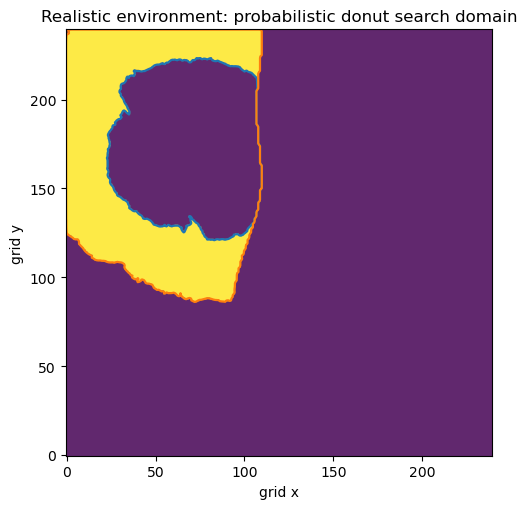

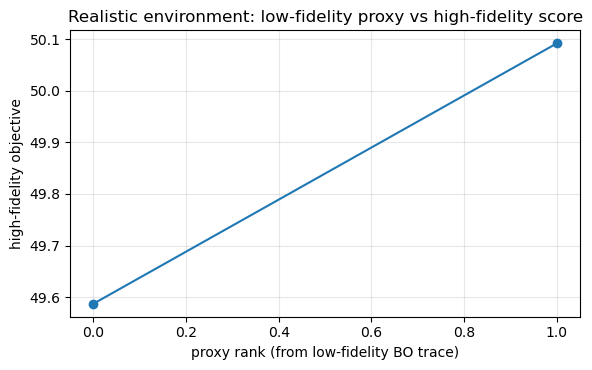

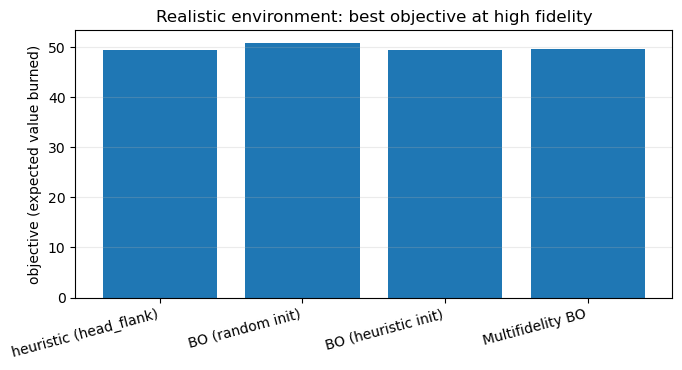

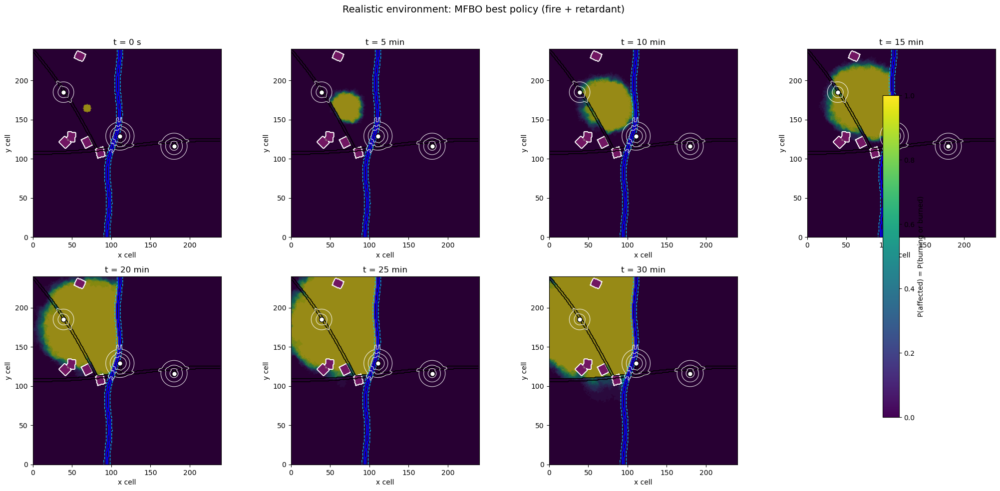

Applying retardant drop: D=[[ 18.         202.           2.01984163]
 [ 27.         125.           1.60279399]
 [ 42.         120.           1.61806564]
 [ 80.         106.           2.51135265]
 [ 95.         111.           0.90189565]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[ 18.         202.           2.01984163]
 [ 27.         125.           1.60279399]
 [ 42.         120.           1.61806564]
 [ 80.         106.           2.51135265]
 [ 95.         111.           0.90189565]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[ 18.         202.           2.01984163]
 [ 27.         125.           1.60279399]
 [ 42.         120.           1.61806564]
 [ 80.         106.           2.51135265]
 [ 95.         111.           0.90189565]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[ 18.         202.           2.01984163]
 [ 27.         125.           1.60279399]
 [ 42.         120.           1.61806564]
 [ 80. 

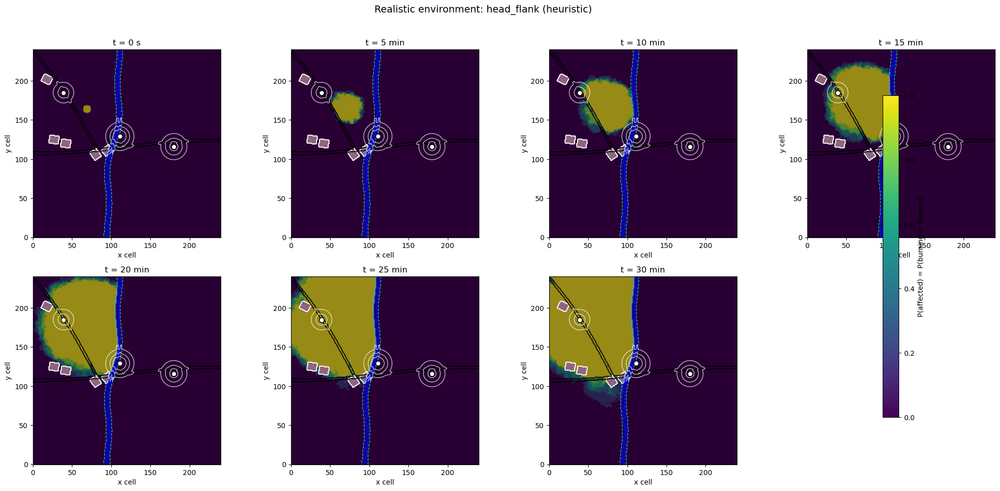

Applying retardant drop: D=[[ 10.         211.           4.79231163]
 [ 20.         122.           2.3443313 ]
 [ 48.         115.           1.37121574]
 [ 88.         105.           1.53589708]
 [102.         124.           1.55012724]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[ 10.         211.           4.79231163]
 [ 20.         122.           2.3443313 ]
 [ 48.         115.           1.37121574]
 [ 88.         105.           1.53589708]
 [102.         124.           1.55012724]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[ 10.         211.           4.79231163]
 [ 20.         122.           2.3443313 ]
 [ 48.         115.           1.37121574]
 [ 88.         105.           1.53589708]
 [102.         124.           1.55012724]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[ 10.         211.           4.79231163]
 [ 20.         122.           2.3443313 ]
 [ 48.         115.           1.37121574]
 [ 88. 

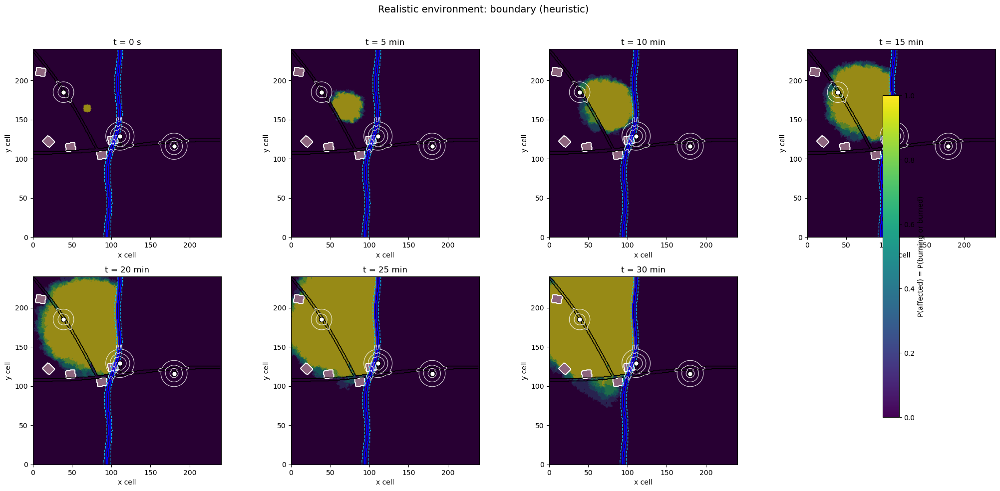

Applying retardant drop: D=[[ 33.         196.           1.98261425]
 [ 33.         196.           2.05657155]
 [101.         125.           0.87869304]
 [104.         130.           0.63243843]
 [104.         130.           0.8985668 ]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[ 33.         196.           1.98261425]
 [ 33.         196.           2.05657155]
 [101.         125.           0.87869304]
 [104.         130.           0.63243843]
 [104.         130.           0.8985668 ]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[ 33.         196.           1.98261425]
 [ 33.         196.           2.05657155]
 [101.         125.           0.87869304]
 [104.         130.           0.63243843]
 [104.         130.           0.8985668 ]], amount=2.0, drop_w_km=0.5, drop_h_km=0.6
Applying retardant drop: D=[[ 33.         196.           1.98261425]
 [ 33.         196.           2.05657155]
 [101.         125.           0.87869304]
 [104. 

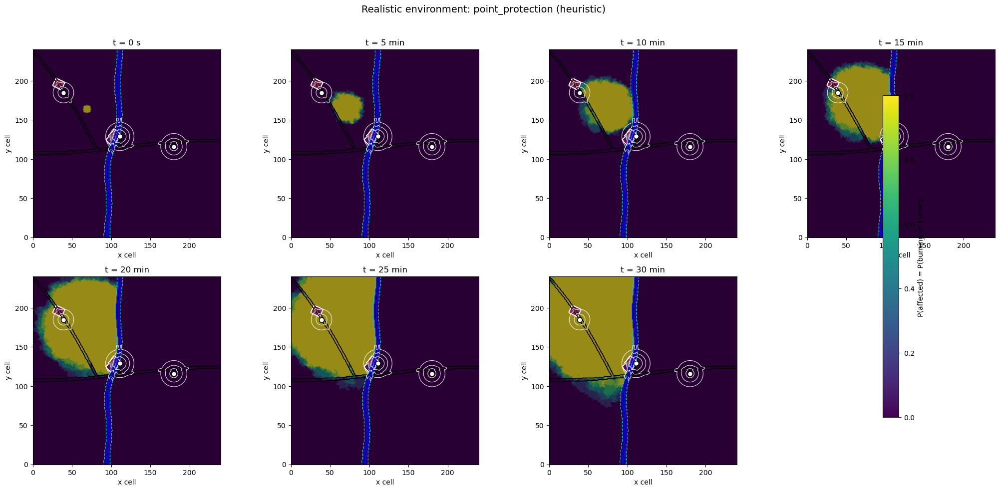

   heuristic: obj_low=49.67  obj_high=49.48
   bo_random: obj_low=50.74  obj_high=50.84
bo_heuristic: obj_low=50.90  obj_high=49.40
multifidelity: obj_low=49.63  obj_high=49.59


In [15]:

# -------- user knobs --------
OUTDIR = "report_figs"   # change if you want
RUN_NOW = True           # set False if you only want the helpers

os.makedirs(OUTDIR, exist_ok=True)

if RUN_NOW:
    results = run_pipeline(
        bundle,
        n_drones=5,
        evolution_time_s=EVOLUTION_TIME_S,
        ignition_radius_km=IGNITION_RADIUS_KM,
        fidelity_low=FIDELITY_LOW,
        fidelity_high=FIDELITY_HIGH,
        bo_n_init=BO_N_INIT,
        drop_time_s=DROP_TIME_S,
        search_grid_evolution_time_s=SEARCH_GRID_EVOLUTION_TIME_S,
        bo_n_iters=BO_N_ITERS,
        bo_n_candidates=BO_N_CANDIDATES,
        seed=0,
    )

    # 1) donut/search mask figure (uses the high-fidelity optimiser stored on the MF result)
    opt_for_mask = results['multifidelity'].extra['opt_high']
    plot_search_domain(
        opt_for_mask,
        title=f"{bundle.name}: probabilistic donut search domain",
        savepath=os.path.join(OUTDIR, f"{bundle.name}_donut.png"),
    )

    # 2) BO convergence curves
    plot_bo_history(results['bo_random'].hist, title=f"BO convergence (random init): {bundle.name}")
    plt.savefig(os.path.join(OUTDIR, f"{bundle.name}_bo_random_history.png"), dpi=250, bbox_inches='tight')
    plt.close()

    plot_bo_history(results['bo_heuristic'].hist, title=f"BO convergence (heuristic init): {bundle.name}")
    plt.savefig(os.path.join(OUTDIR, f"{bundle.name}_bo_heuristic_history.png"), dpi=250, bbox_inches='tight')
    plt.close()

    plot_bo_history(results['multifidelity'].hist, title=f"BO convergence (MF stage-1): {bundle.name}")
    plt.savefig(os.path.join(OUTDIR, f"{bundle.name}_mf_stage1_history.png"), dpi=250, bbox_inches='tight')
    plt.close()

    # 3) Multifidelity validation plot
    plot_multifidelity_validation(
        results['multifidelity'].extra['hi_rows'],
        title=f"{bundle.name}: low-fidelity proxy vs high-fidelity score",
        savepath=os.path.join(OUTDIR, f"{bundle.name}_mf_validation.png"),
    )

    # 4) Method comparison bar chart
    plot_method_comparison(
        results,
        title=f"{bundle.name}: best objective at high fidelity",
        savepath=os.path.join(OUTDIR, f"{bundle.name}_method_comparison.png"),
    )

    # 5) Fire evolution visual for the best method (MFBO)
    theta = results['multifidelity'].theta
    opt_hi = results['multifidelity'].extra['opt_high']
    drone_params = opt_hi.decode_theta(theta)
    plot_fire_evolution_with_context(
        fire_model=opt_hi.fire_model,
        init_firestate=opt_hi.init_firestate,
        T_s=30*60,
        n_sims=FIDELITY_HIGH,
        drone_params=drone_params,
        dt_snapshot_s=5*60,
        seed=0,
        roads_mask=bundle.road_mask,
        river_mask=bundle.river_mask,
        riparian_mask=bundle.riparian_mask,
        town_centers=bundle.town_centers,
        value_map=bundle.env.value,
        value_contours=(3.0, 6.0, 10.0),
        title=f"{bundle.name}: MFBO best policy (fire + retardant)",
        retardant_alpha=0.4,
        retardant_contours=(0.4, 0.8, 1.2),
    )
    plt.savefig(os.path.join(OUTDIR, f"{bundle.name}_mf_best_evolution.png"), dpi=250, bbox_inches='tight')
    plt.close()

    # 6) Fire evolution per heuristic (low-fidelity for speed)
    heur_rows = results['heuristic'].extra['heur_rows']
    opt_low_for_heur = results['heuristic'].extra['opt_low']
    for row in heur_rows:
        h_name = row['heuristic']
        theta_h = row['best_theta']
        drone_params = opt_low_for_heur.decode_theta(theta_h)
        plot_fire_evolution_with_context(
            fire_model=opt_low_for_heur.fire_model,
            init_firestate=opt_low_for_heur.init_firestate,
            T_s=30*60,
            n_sims=FIDELITY_LOW,
            drone_params=drone_params,
            dt_snapshot_s=5*60,
            seed=0,
            roads_mask=bundle.road_mask,
            river_mask=bundle.river_mask,
            riparian_mask=bundle.riparian_mask,
            town_centers=bundle.town_centers,
            value_map=bundle.env.value,
            value_contours=(3.0, 6.0, 10.0),
            title=f"{bundle.name}: {h_name} (heuristic)",
            retardant_alpha=0.4,
            retardant_contours=(0.4, 0.8, 1.2),
        )
        safe_name = h_name.replace('/', '_').replace(' ', '_')
        plt.savefig(os.path.join(OUTDIR, f"{bundle.name}_heur_{safe_name}.png"), dpi=250, bbox_inches='tight')
        plt.close()


    # Print a compact summary for your report table
    for k,v in results.items():
        print(f"{k:>12}: obj_low={v.obj_low:.2f}  obj_high={v.obj_high:.2f}")
